In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import torch
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly import express as px
from sklearn.linear_model import LinearRegression

import warnings, os
import mysql.connector as mysql
warnings.filterwarnings('ignore')
username = os.environ['MYSQL_user']
password = os.environ['MYSQL_password']
DB = mysql.connect(host = "localhost", user = username, passwd = password, database = "AIRBNB")
cursor = DB.cursor(buffered=True)

## Utils

In [2]:
def read_table_from_db(table_name):
    df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
    df['geometry'] = gpd.GeoSeries.from_wkt(df['geometry'])
    df = gpd.GeoDataFrame(df, geometry='geometry')
    return df

In [3]:
def base_information(data):
    df =  pd.DataFrame(data.dtypes, columns=['dtypes'])
    df['Number of missing values'] = data.isna().sum()
    df['Percentage of missing values'] = data.isna().sum()/data.shape[0]
    df['Unique values'] = data.nunique().values
    df['Count'] = data.count().values
    return df.style.background_gradient(cmap='Blues')

In [4]:
class Plots:
    def __init__(self):
        self.quantiles_dict = {"Min": 0, "Q1": 0.25, "Med": 0.5, "Q3": 0.75, "Max": 1}

    def check_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray) and not torch.is_tensor(data):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array or torch tensor.')
        data = np.array(data)
        data = data[~np.isnan(data)]
        if(data.ndim == 2):
            data = data.squeeze()
        return data
    
    def check_2d_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray) and not torch.is_tensor(data):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array or torch tensor.')
        return np.array(data)
    
    def histogram_and_box_plot(self, data, name="", annotations=True, bin_size=1):
        data = self.check_data(data=data)
        fig = make_subplots(rows=1, cols=2, specs=[[{"type": "histogram"}, {"type": "box"}]])
        fig.add_trace(go.Box(y=data, name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data, marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data, self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data, self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data, value), text=key + ": " + str(np.round(np.quantile(data, value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def histogram_boxplot_linear_regression(self, data, feature, target, name="", annotations=True, bin_size=1):
        model = LinearRegression()
        no_nan_indices = ~data[feature].isna()
        model.fit(data[no_nan_indices][feature].values.reshape(-1, 1), data[no_nan_indices][target])
        predictions = model.predict(data[no_nan_indices][feature].values.reshape(-1, 1))
        fig = make_subplots(rows=1, cols=3, specs=[[{"type": "histogram"}, {"type": "box"}, {"type": "scatter"}]])
        fig.add_trace(go.Box(y=data[no_nan_indices][feature], name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data[no_nan_indices][feature], marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=data[no_nan_indices][target], mode='markers', marker=dict(color="lightblue"), name='Real values', showlegend=False), row=1, col=3)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=predictions, mode='lines', line_color="green", name=feature, showlegend=False), row=1, col=3)
        fig.update_xaxes(title_text=feature, row=1, col=3)
        fig.update_yaxes(title_text=f"{target}", row=1, col=3)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data[feature], self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data[feature], self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data[feature], value), text=key + ": " + str(np.round(np.quantile(data[feature], value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=2000, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def plot_time_series_count(self, data, column, agg_freq='D', title=""):
        data_copy = data.copy()
        data_copy[column] = pd.to_datetime(data_copy[column])
        data_copy.set_index(column, inplace=True)
        data_copy = data_copy.resample(agg_freq).size()
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy.values, mode='lines', line=dict(color="blue")))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{title}<b>", title_x=0.5, xaxis_title="Date", yaxis_title="Count", font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def pie_boxplot_by_categorical(self, data, categorical, target, name=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        colors = px.colors.qualitative.Dark24
        rows, columns = 1, 2
        fig = make_subplots(rows=rows, cols=columns, specs=[[{"type": "pie"}, {"type": "bar"}] for i in range(0, rows)])
        fig.add_trace(go.Pie(values=frequency, labels=labels, showlegend=True, textinfo='value+percent', hole=0.3, marker=dict(line=dict(color='black', width=2), colors=colors)), row=1, col=1)
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def plot_amenities_distribution(self, amenities_data):
        fig = go.Figure()
        for column in amenities_data.columns:
            fig.add_trace(go.Bar(x=amenities_data.index, y=amenities_data[column], name=column))
        fig.update_layout(template="simple_white",width=1600,height=800,font=dict(family="Times New Roman", size=26, color="Black"), xaxis_title="Udogodnienie", yaxis_title="Procent", legend=dict(font=dict(size=26), bordercolor="black", borderwidth=1, bgcolor="white", traceorder="normal", x=0.9, y=1.2, orientation="v", itemclick="toggleothers", itemdoubleclick="toggle", tracegroupgap=5))
        fig.show("png")
    
plots = Plots()

# Load dataset

In [5]:
listings = read_table_from_db('listings_cleaned')
listings

,listing_id,listing_url,last_scraped,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,...,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,geometry,bathrooms_number,is_bathroom_shared,time_since_first_review,time_since_last_review
0,2595,https://www.airbnb.com/rooms/2595,2024-09-05,2008-09-09,within a day,51-90%,0-50%,f,7,9,...,f,3,3,0,0,POINT (-73.98559 40.75356),1.0,0,3 years and more,1 year and more
1,5121,https://www.airbnb.com/rooms/5121,2024-04-07,2009-02-03,within a day,100%,0-50%,f,2,2,...,f,2,0,2,0,POINT (-73.95512 40.68535),1.0,0,3 years and more,1 year and more
2,5136,https://www.airbnb.com/rooms/5136,2024-09-04,2009-02-03,within an hour,100%,100%,f,1,5,...,t,1,1,0,0,POINT (-73.99454 40.66265),1.5,0,3 years and more,1 year and more
3,6848,https://www.airbnb.com/rooms/6848,2024-09-05,2009-05-06,within an hour,100%,100%,t,1,1,...,f,1,1,0,0,POINT (-73.95342 40.70935),1.0,0,3 years and more,1-2 months
4,6872,https://www.airbnb.com/rooms/6872,2024-09-04,2009-05-07,within a day,0-50%,0-50%,f,2,2,...,f,2,0,2,0,POINT (-73.94255 40.80107),1.0,1,2-3 years,1 year and more
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35079,1237082867457012401,https://www.airbnb.com/rooms/1237082867457012401,2024-09-05,2019-06-13,within an hour,100%,0-50%,f,2,16,...,t,2,2,0,0,POINT (-73.9472 40.77999),1.0,0,unknown,unknown
35080,1237100764139053201,https://www.airbnb.com/rooms/1237100764139053201,2024-09-05,2023-07-30,unknown,unknown,91-99%,f,2,3,...,f,2,2,0,0,POINT (-73.99353 40.7561),1.0,0,unknown,unknown
35081,1237358247584723886,https://www.airbnb.com/rooms/1237358247584723886,2024-09-05,2010-11-03,within a few hours,100%,51-90%,t,2,9,...,f,2,0,2,0,POINT (-73.92659 40.67718),1.0,1,unknown,unknown
35082,1237635858712477126,https://www.airbnb.com/rooms/1237635858712477126,2024-09-05,2023-12-07,unknown,unknown,51-90%,f,3,3,...,f,3,0,3,0,POINT (-73.96118 40.76004),1.0,0,unknown,unknown


In [6]:
base_information(listings)

,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
listing_id,int64,0,0.000000,35084,35084
listing_url,object,0,0.000000,35084,35084
last_scraped,object,0,0.000000,23,35084
host_since,object,0,0.000000,4889,35084
host_response_time,object,0,0.000000,5,35084
host_response_rate,object,0,0.000000,5,35084
host_acceptance_rate,object,0,0.000000,5,35084
host_is_superhost,object,0,0.000000,2,35084
host_listings_count,int64,0,0.000000,271,35084
host_total_listings_count,int64,0,0.000000,319,35084


# Features exploration

# Target variable

## `price`

`price` (continous) - the price of the listing. <b>Target variable<b>.

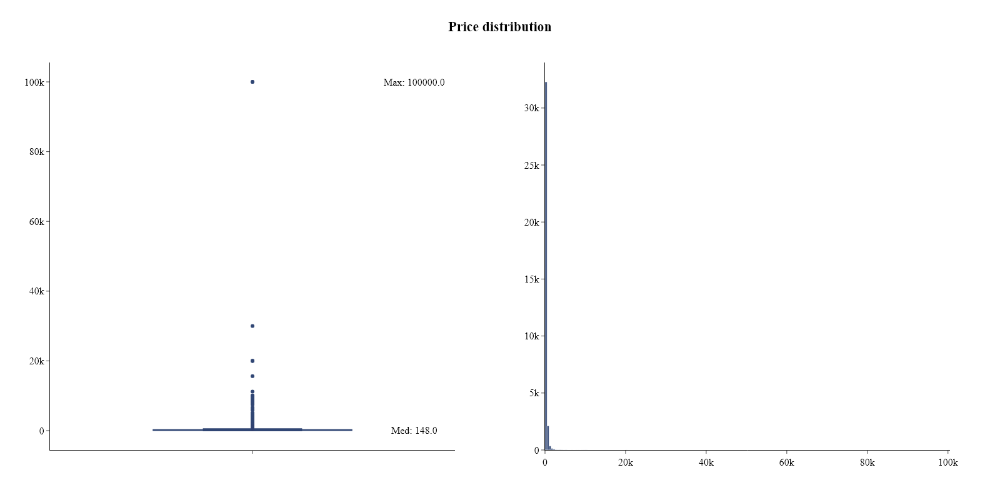

In [7]:
listings['price'] = listings['price'].str.replace('[$,]', '', regex=True).astype(float)
plots.histogram_and_box_plot(listings['price'], name="price", annotations=["Med", "Max"], bin_size=500)

**Notes:**
- The price variable has several outliers, which after analysis do not seem to be valid prices.
- After investigating the outliers, I found that the listings with price above 1 000$ are not valid.

**Conclusion:** 
- I will remove the outliers (which are above 1 000$) from the dataset.

In [8]:
# def read_table_from_db_geo(table_name):
#     df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
#     df['geometry'] = gpd.GeoSeries.from_wkt(df['geometry'])
#     df = gpd.GeoDataFrame(df, geometry='geometry')
#     df.crs = "EPSG:4326"
#     for col in df.columns:
#         # if len(df[col].unique()) == 2:
#         #     df[col] = df[col].astype('category')
#         if len(df[col].unique()) == 2 or (df[col].dtype == 'object' and len(df[col].unique()) < 10):
#             df[col] = df[col].astype('category')
#     return df

# def read_table_from_db(table_name):
#     df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
#     for col in df.columns:
#         # if len(df[col].unique()) == 2:
#         #     df[col] = df[col].astype('category')
#         if len(df[col].unique()) == 2 or (df[col].dtype == 'object' and len(df[col].unique()) < 10):
#             df[col] = df[col].astype('category')
#     return df
# listings = read_table_from_db_geo('listings_cleaned')
# image_data = read_table_from_db('image_data')
# listings = listings.merge(image_data, on='listing_id', how='inner')
# listings['price'] = listings['price'].str.replace('[$,]', '', regex=True).astype(float)
# price_threshold_max: int = 1000
# price_threshold_min: int = 25
# print(f"Number of listings for which the price is greater than {price_threshold_min}$ and less than {price_threshold_max}$: {listings[(listings['price'] >= price_threshold_min) & (listings['price'] <= price_threshold_max)].shape[0]} ({round(listings[(listings['price'] >= price_threshold_min) & (listings['price'] <= price_threshold_max)].shape[0] / listings.shape[0] * 100, 4)}%)")
#Number of listings for which the price is greater than 25$ and less than 1000$: 19459 (98.5915%)

In [9]:
price_threshold_max: int = 1000
price_threshold_min: int = 25
print(f"Number of listings for which the price is greater than {price_threshold_min}$ and less than {price_threshold_max}$: {listings[(listings['price'] >= price_threshold_min) & (listings['price'] <= price_threshold_max)].shape[0]} ({round(listings[(listings['price'] >= price_threshold_min) & (listings['price'] <= price_threshold_max)].shape[0] / listings.shape[0] * 100, 4)}%)")
listings = listings[(listings['price'] >= price_threshold_min) & (listings['price'] <= price_threshold_max)]

Number of listings for which the price is greater than 25$ and less than 1000$: 34422 (98.1131%)


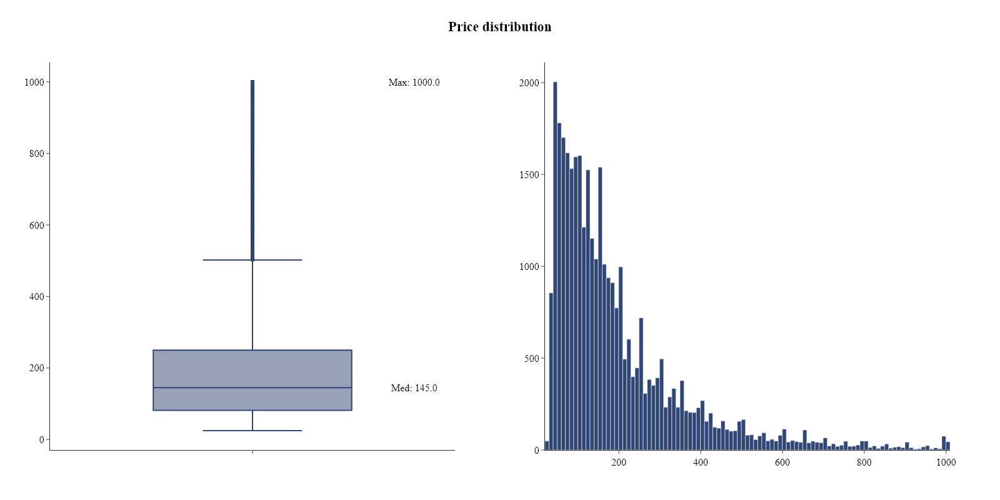

In [10]:
plots.histogram_and_box_plot(listings['price'], name="price", annotations=["Med", "Max"], bin_size=10)

**Notes:**
- The price variable is right-skewed. 
- Majority of the listings have a price below 250$ (almost 75%).

**Conclusion:**
- I will apply a log transformation to the price variable to make it more normally distributed.

In [11]:
listings["log_price"] = np.log(listings["price"])
listings.drop(columns=["price"], inplace=True)

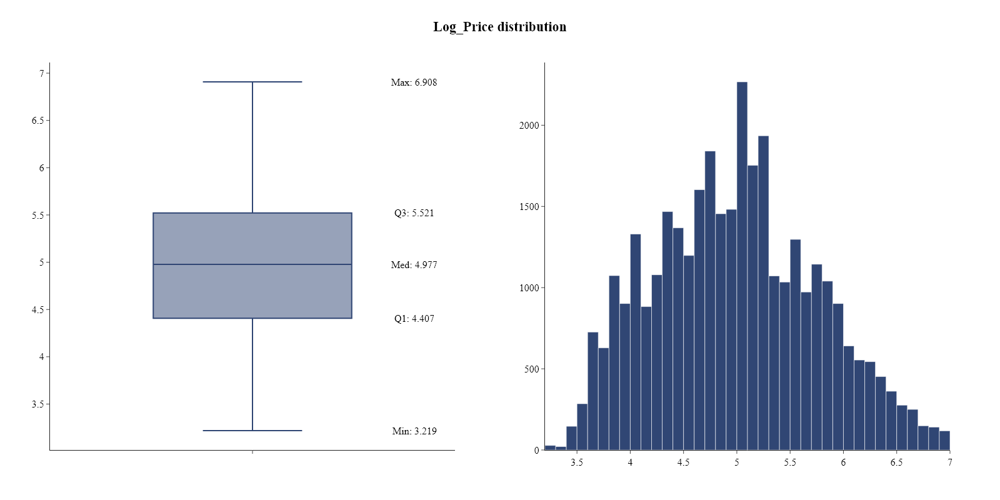

In [12]:
plots.histogram_and_box_plot(listings['log_price'], name="log_price", annotations=True, bin_size=0.1)

**Notes:**
- The distribution of target variable after applying logarithmic transformation looks more normally distributed with median around 5.

# Rental policy

## `minimum_nights`

`minimum_nights` - the minimum number of nights a guest can book the listing for.

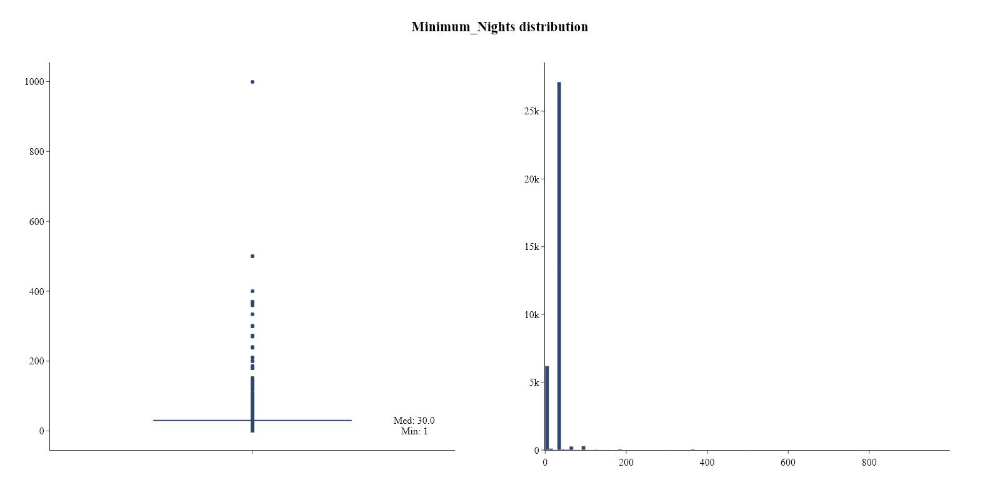

In [13]:
plots.histogram_and_box_plot(listings['minimum_nights'], name="minimum_nights", annotations=["Min", "Med"], bin_size=10)

**Notes:**
- Variable is right-skewed.

**Conclusion:**
- Due to the fact that the we want to analyse SHORT-TERM rentals, I will remove the outliers (which are above 30 days) from the dataset.

In [14]:
minimum_nights_threshold = 30
print(f"Number of listings for which the minimum_nights is greater than {minimum_nights_threshold} days: {listings[listings['minimum_nights'] > minimum_nights_threshold].shape[0]} ({round(listings[listings['minimum_nights'] > minimum_nights_threshold].shape[0] / listings.shape[0] * 100, 4)}%)")
listings = listings[listings['minimum_nights'] <= minimum_nights_threshold]

Number of listings for which the minimum_nights is greater than 30 days: 2224 (6.461%)


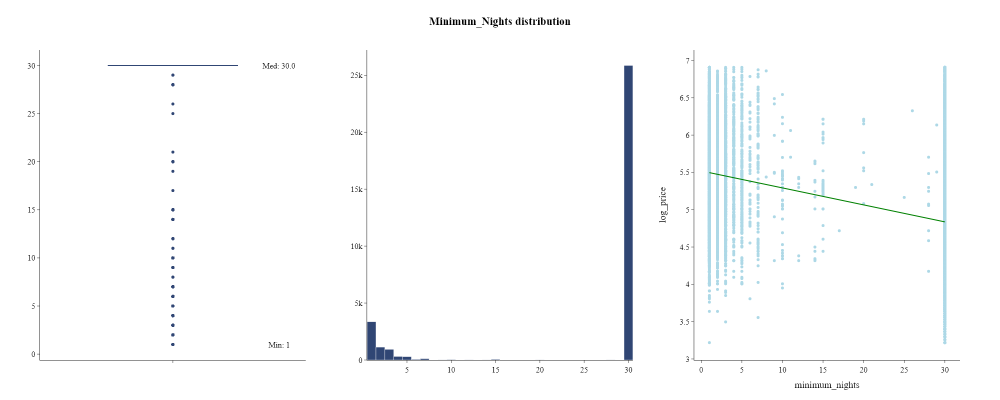

In [15]:
plots.histogram_boxplot_linear_regression(listings, "minimum_nights", "log_price", name="minimum_nights", annotations=["Min", "Med"], bin_size=1)

**Notes:**
- Most of listings have minimum nights equal to 30.

## `maximum_nights`

`maximum_nights` - the maximum number of nights a guest can book the listing for.

**Notes:**
- There is one strange outlier with a value above 10k days. However listing looks valid, therefore I will use winsorization to handle all outliers above 99th percentile.

**Conclusion:**
- I will apply winsorization to the `maximum_nights` variable to handle the outliers.

In [16]:
ninetyninth_percentile = np.percentile(listings['maximum_nights'], 99)
print("99th percentile of maximum nights:", ninetyninth_percentile)
listings.loc[listings['maximum_nights'] > ninetyninth_percentile, 'maximum_nights'] = ninetyninth_percentile

99th percentile of maximum nights: 1125.0


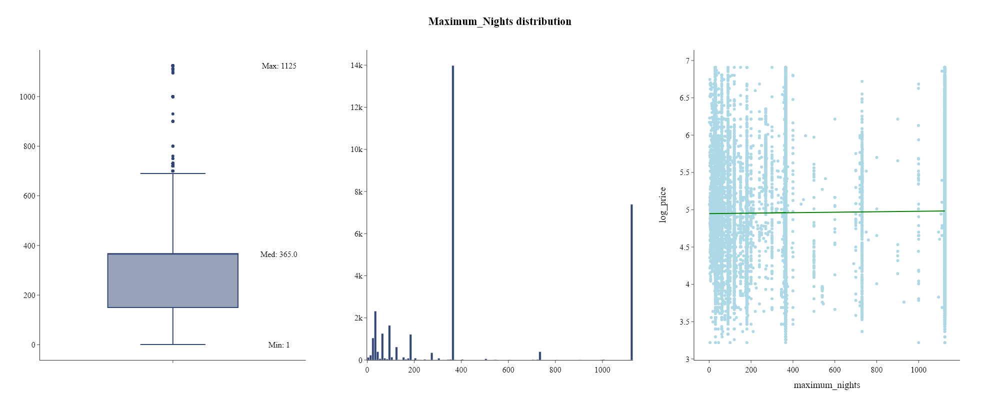

In [17]:
plots.histogram_boxplot_linear_regression(listings, "maximum_nights", "log_price", name="maximum_nights", annotations=["Min", "Med", "Max"], bin_size=10)

**Notes:**
- After winsorization, we can see that most of the listings have a maximum number of nights equal to 365 days.

## `minimum_minimum_nights`, `maximum_minimum_nights`, `minimum_nights_avg_ntm`

`minimum_minimum_nights` - the smallest minimum_night value from the calender (looking 365 nights in the future)

`maximum_minimum_nights` - the largest minimum_night value from the calender (looking 365 nights in the future)

`minimum_nights_avg_ntm` - the average minimum_night value from the calender (looking 365 nights in the future)

I will calculate the correlation between above variables and `minimum_nights` variable (due to my assumption that they should be highly correlated).

In [18]:
listings[["minimum_nights", "minimum_minimum_nights", "maximum_minimum_nights", "minimum_nights_avg_ntm"]].corr(method="spearman")

,minimum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_nights_avg_ntm
minimum_nights,1.000000,0.985940,0.939231,0.970460
minimum_minimum_nights,0.985940,1.000000,0.944468,0.977860
maximum_minimum_nights,0.939231,0.944468,1.000000,0.972202
minimum_nights_avg_ntm,0.970460,0.977860,0.972202,1.000000


**Notes:**
- The correlation between `minimum_nights` and other variables is very high, which confirms my assumption.

**Conclusion:**
- Due to the high correlation between `minimum_nights` and other variables, I will remove them from the dataset because they do not provide any additional information and may cause multicollinearity.

In [19]:
listings.drop(["minimum_minimum_nights", "maximum_minimum_nights", "minimum_nights_avg_ntm"], axis=1, inplace=True)

## `maximum_maximum_nights`, `minimum_maximum_nights`, `maximum_nights_avg_ntm`

`maximum_maximum_nights` - the largest maximum_night value from the calender (looking 365 nights in the future)

`minimum_maximum_nights` - the smallest maximum_night value from the calender (looking 365 nights in the future)

`maximum_nights_avg_ntm` - the average maximum_night value from the calender (looking 365 nights in the future)

Similarly to the previous step, I will calculate the correlation between above variables and `maximum_nights` variable.

In [20]:
listings[["maximum_nights", "maximum_maximum_nights", "minimum_maximum_nights", "maximum_nights_avg_ntm"]].corr(method="spearman")

,maximum_nights,maximum_maximum_nights,minimum_maximum_nights,maximum_nights_avg_ntm
maximum_nights,1.000000,0.627622,0.505937,0.572713
maximum_maximum_nights,0.627622,1.000000,0.851492,0.947031
minimum_maximum_nights,0.505937,0.851492,1.000000,0.947047
maximum_nights_avg_ntm,0.572713,0.947031,0.947047,1.000000


**Notes:**
- Once again, the correlation is pretty high between `maximum_nights` and other variables.

**Conclusion:**
- I will remove the variables from the dataset due to the high correlation with `maximum_nights` variable.

In [21]:
listings.drop(["maximum_maximum_nights", "minimum_maximum_nights", "maximum_nights_avg_ntm"], axis=1, inplace=True)

### `availability_30`, `availability_60`, `availability_90`, `availability_365`

`availability_30` - the number of days that the listing is available for the next 30 days.

`availability_60` - the number of days that the listing is available for the next 60 days.

`availability_90` - the number of days that the listing is available for the next 90 days.

`availability_365` - the number of days that the listing is available for the next 365 days.

Worth to note that the listing may be unabaliable due to the fact that it is already booked but also due to the fact that the host does not want to rent it.

In [22]:
listings[['availability_30', 'availability_60', 'availability_90', 'availability_365', 'log_price']].corr(method='spearman')

,availability_30,availability_60,availability_90,availability_365,log_price
availability_30,1.000000,0.941742,0.900800,0.433723,0.042645
availability_60,0.941742,1.000000,0.978490,0.483824,0.006865
availability_90,0.900800,0.978490,1.000000,0.531562,0.008073
availability_365,0.433723,0.483824,0.531562,1.000000,0.022442
log_price,0.042645,0.006865,0.008073,0.022442,1.000000


**Notes:**
- Correlation between `availability_30`, `availability_60` and `availability_90` is very high ~0.9.
- Biggest Spearman correlation between availability variables and `log_price` is between `availability_365` and `availability_30`.

**Conclusion:**
- Due to the fact that the correlation between `availability_30`, `availability_60` and `availability_90` is very high, I will remove the last two mentioned variables from the dataset as they are less correlated with the target variable.

In [23]:
listings.drop(['availability_60', 'availability_90'], axis=1, inplace=True)

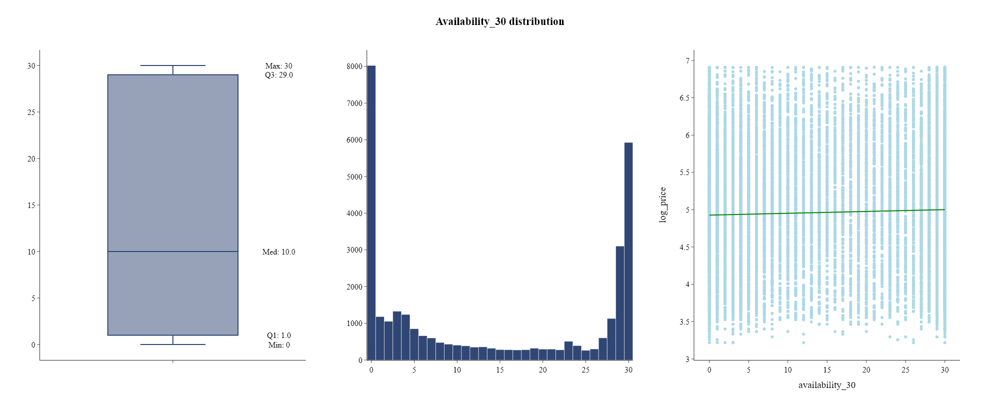

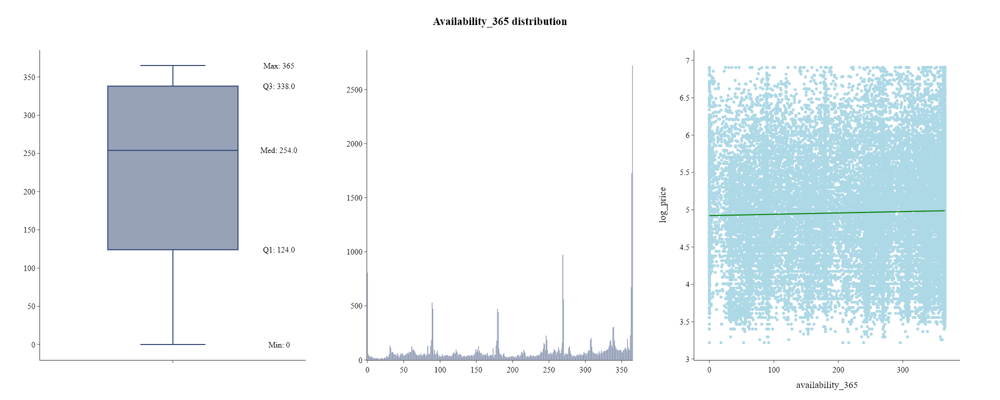

In [24]:
plots.histogram_boxplot_linear_regression(listings, "availability_30", "log_price", name="availability_30", annotations=True, bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "availability_365", "log_price", name="availability_365", annotations=True, bin_size=1)

**Notes:**
- For both variables there is almost no linear relationship with `log_price` as the regression line is flat.

## `instant_bookable`

`instant_bookable` - whether the listing is instantly bookable or not.

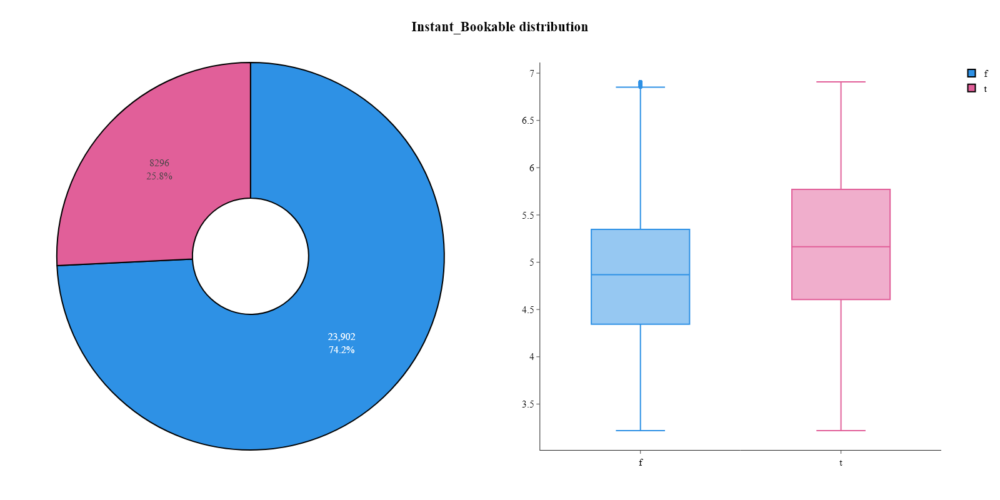

In [25]:
plots.pie_boxplot_by_categorical(listings, "instant_bookable", "log_price", name="instant_bookable")

**Notes:**
- `instant_bookable` is a binary variable.
- 1/3 of the listings are instantly bookable and it seems that the listings for which the `instant_bookable` is equal to 1 have slightly higher median `log_price`.

**Conclusion:**
- I will use Label-Encoder to convert the `instant_bookable` variable into a numerical format (0 - not instantly bookable, 1 - instantly bookable).

In [26]:
listings['instant_bookable'] = listings['instant_bookable'].map({'t': 1, 'f': 0}).astype(bool)

# Host attributes

## `host_since`

`host_since` - the date the host first joined Airbnb.

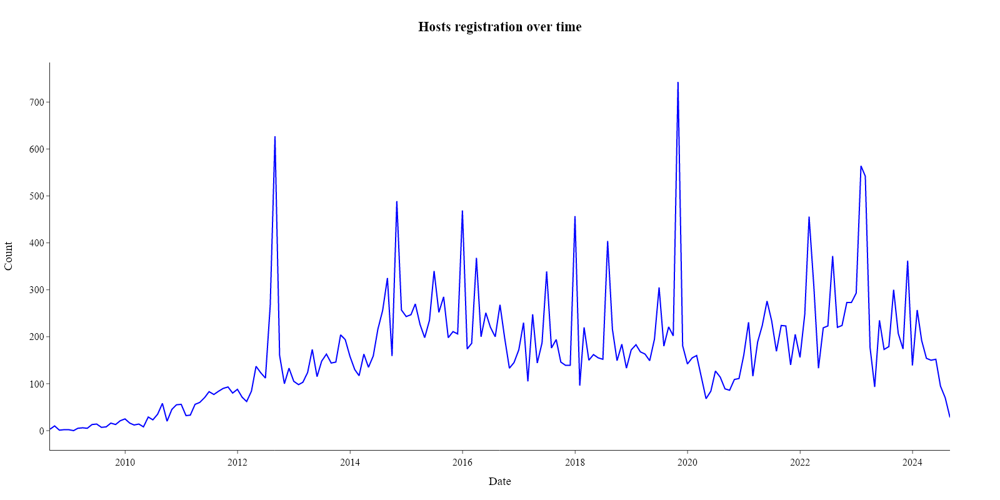

In [27]:
plots.plot_time_series_count(listings, column='host_since', agg_freq="M", title='Hosts registration over time')

**Notes:**
- Since the beginning of data, the number of hosts has been increasing and stabilized around 200 of hosts registrations per month.

**Conclusion:**
- We will create a new feature `days_since_host` to represent the number of days since the host first joined Airbnb.

In [28]:
listings['host_since'] = pd.to_datetime(listings['host_since'])
listings["last_scraped"] = pd.to_datetime(listings["last_scraped"])
listings["days_since_host"] = (listings["last_scraped"] - listings["host_since"]).dt.days

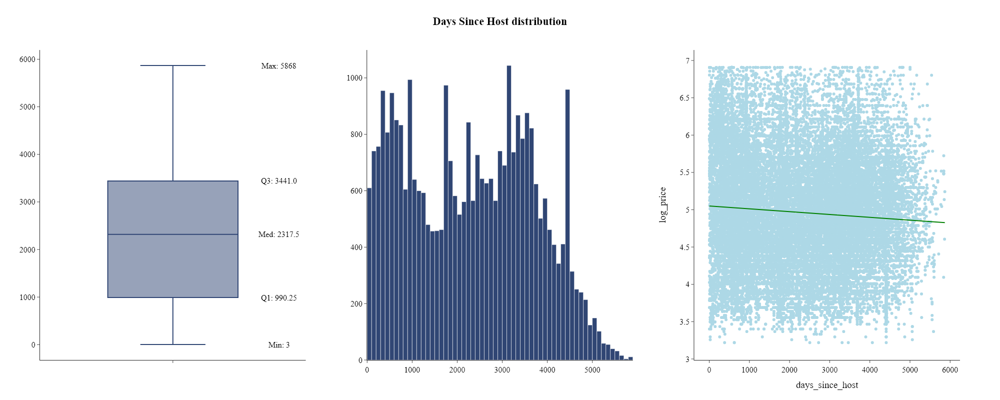

In [29]:
plots.histogram_boxplot_linear_regression(listings, "days_since_host", "log_price", name="Days since host", annotations=True, bin_size=100)

**Notes:**
- Median of `days_since_host` is 2303 days, which is approximately 6 years.
- There is no strong linear relationship between `days_since_host` and `log_price` since the linear regression line is almost flat.

**Conclusion:**
- I will remove the `host_since` and `last_scraped` variables from the dataset as they are no longer needed.

In [30]:
listings.drop(["host_since", "last_scraped"], axis=1, inplace=True)

## `host_response_time`

`host_response_time` - the time the host takes to respond to a message. It is a categorical variable.

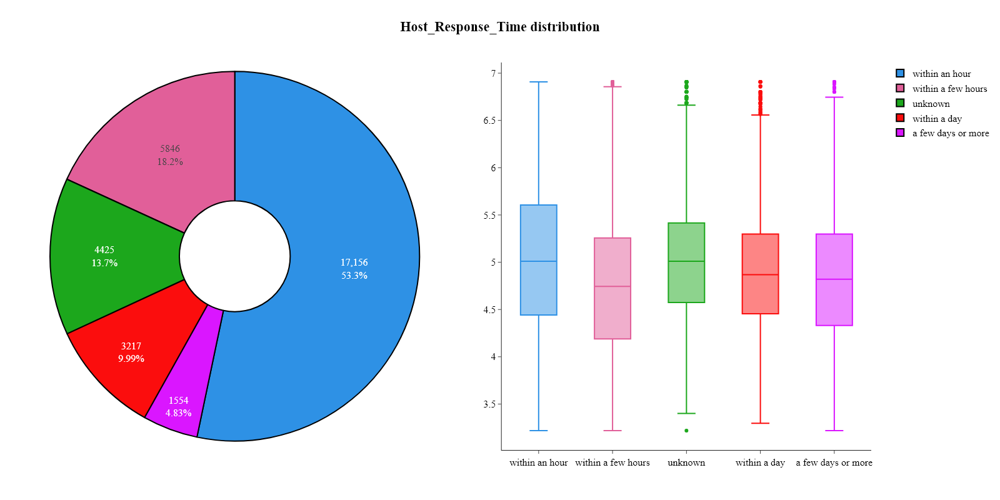

In [31]:
plots.pie_boxplot_by_categorical(listings, "host_response_time", "log_price", name="host_response_time")

**Notes:**
- The most common response time is within an hour.
- There is not much difference in the price between different response times.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [32]:
listings['host_response_time'] = listings['host_response_time'].astype('category')

## `host_response_rate`

`host_response_rate` - the response rate of the host.

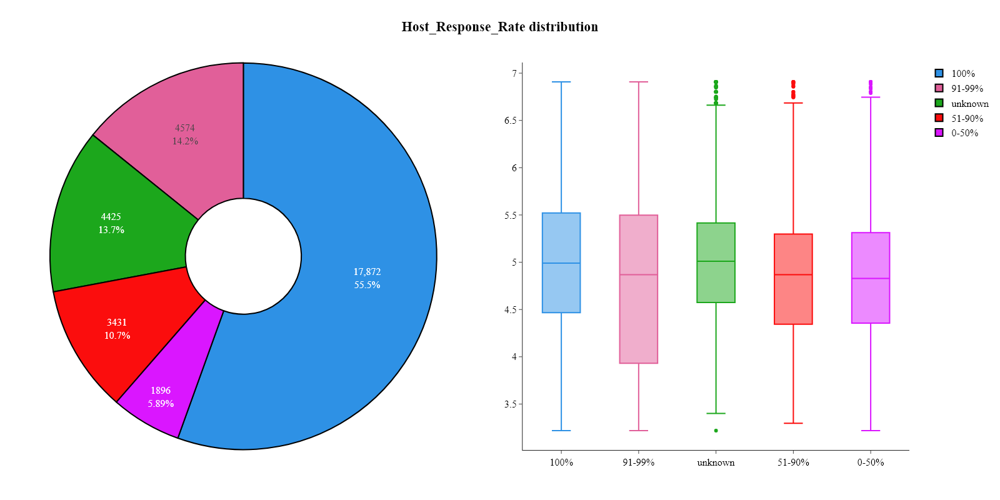

In [33]:
plots.pie_boxplot_by_categorical(listings, "host_response_rate", "log_price", name="host_response_rate")

**Notes:**
- The most common response rate is 100%.
- It seems that the listings for which the host has a response rate of 0-50% have slightly lower median price.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [34]:
listings['host_response_rate'] = listings['host_response_rate'].astype('category')

## `host_acceptance_rate`

`host_acceptance_rate` - the acceptance rate of the host.

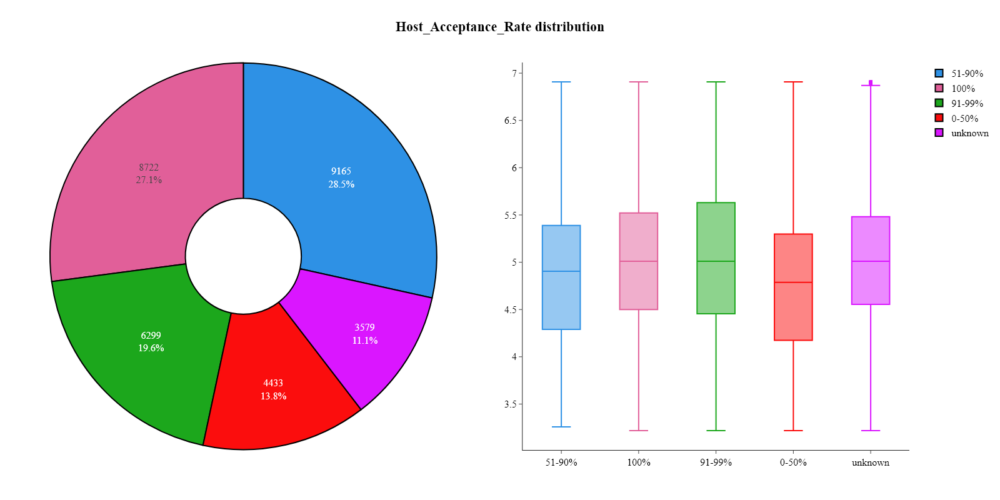

In [35]:
plots.pie_boxplot_by_categorical(listings, "host_acceptance_rate", "log_price", name="host_acceptance_rate")

**Notes:**
- The most common acceptance rate is 51-90%.
- There is not much difference in the price between different acceptance rates.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [36]:
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype('category')

## `host_is_superhost`

`host_is_superhost` - whether the host is a superhost or not.

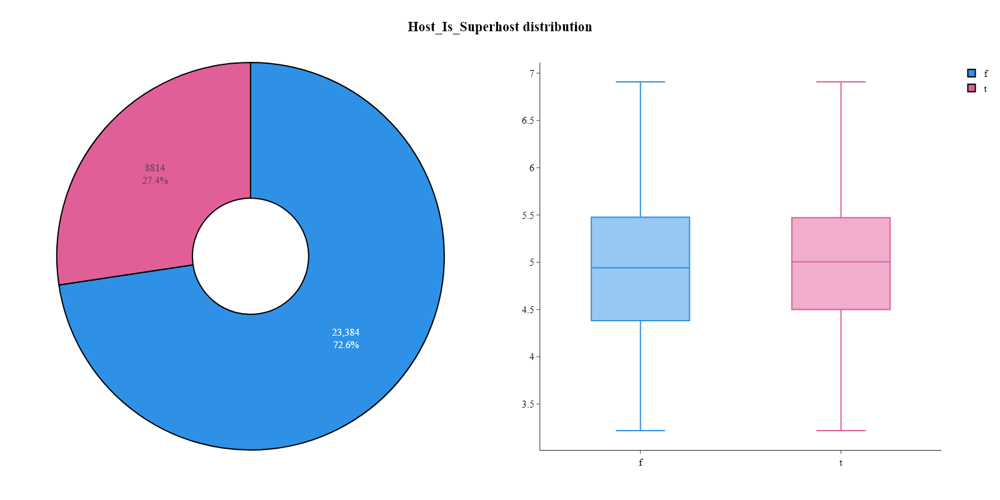

In [37]:
plots.pie_boxplot_by_categorical(listings, "host_is_superhost", "log_price", name="host_is_superhost")

**Notes:**
- `host_is_superhost` is a binary variable.
- Approximately 3/4 of the hosts are not superhosts.

**Conclusion:**
- I will use Label-Encoder to convert the `host_is_superhost` variable into a numerical format (0 - not superhost, 1 - superhost).

In [38]:
listings['host_is_superhost'] = listings['host_is_superhost'].map({'t': 1, 'f': 0}).astype(bool)

### `host_listings_count`, `host_total_listings_count`, `calculated_host_listings_count`

`host_listings_count` - the number of listings the host has.

`calculated_host_listings_count` - the number of listings the host has in the city/region geography.

`host_total_listings_count` - the number of listings the host has (including active, inactive, and archived).

I will calculate the spearman correlation between above variables, since they should be highly correlated.

In [39]:
listings[['host_listings_count', 'calculated_host_listings_count', 'host_total_listings_count']].corr(method='spearman')

,host_listings_count,calculated_host_listings_count,host_total_listings_count
host_listings_count,1.000000,0.958326,0.919407
calculated_host_listings_count,0.958326,1.000000,0.882995
host_total_listings_count,0.919407,0.882995,1.000000


**Notes:**
- The correlation between host listings count variables is very high, which confirms my assumption.

**Conclusion:**
- I will keep only the `host_listings_count` variable and remove the other two due to the high correlation.

In [40]:
listings.drop(["calculated_host_listings_count", "host_total_listings_count"], axis=1, inplace=True)

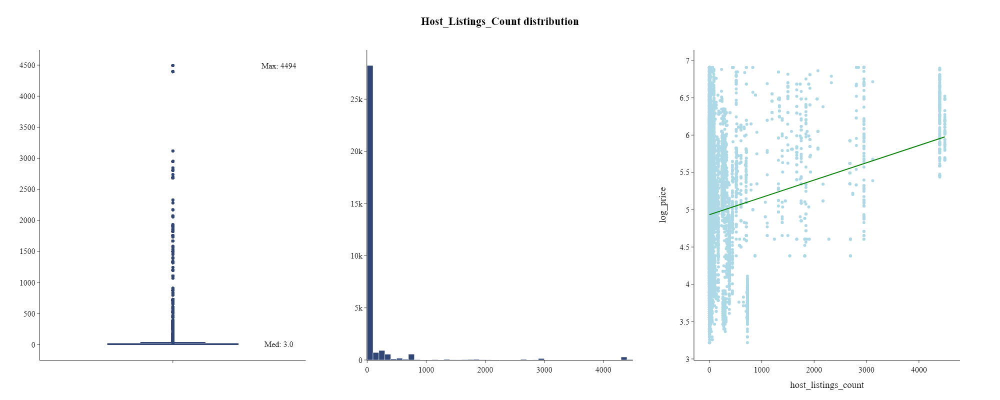

In [41]:
plots.histogram_boxplot_linear_regression(listings, "host_listings_count", "log_price", name="host_listings_count", annotations=["Med", "Max"], bin_size=100)

**Notes:**
- Distribution of the `host_listings_count` variable is right-skewed.
- It seems like the more listings the host has, the higher the price of the listing.

**Conclusions:**
- Due to the right skewness of variable we will apply logarithmic transformation.

In [42]:
listings["log_host_listings_count"] = np.log(listings["host_listings_count"])
listings.drop(columns=["host_listings_count"], inplace=True)

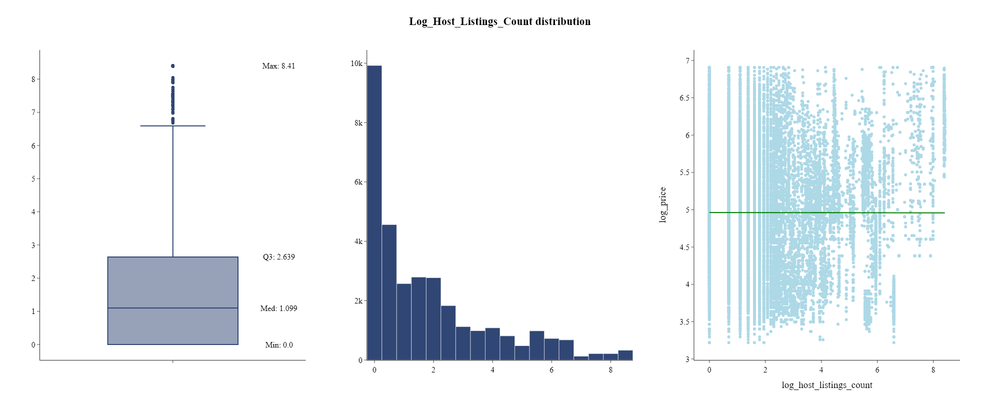

In [43]:
plots.histogram_boxplot_linear_regression(listings, "log_host_listings_count", "log_price", name="log_host_listings_count", annotations=["Min", "Med", "Q3", "Max"], bin_size=0.5)

**Notes:**
- After applying logarithmic transformation, the distribution is still right-skewed, but the skewness has been reduced.
- The relationship between `log_host_listings_count` and `log_price` is not linear.

### `calculated_host_listings_count_entire_homes`, `calculated_host_listings_count_private_rooms`, `calculated_host_listings_count_shared_rooms`

`calculated_host_listings_count_entire_homes` - the number of entire homes that the host has in the current scrape, in the city/region geography.

`calculated_host_listings_count_private_rooms` - the number of private rooms that the host has in the current scrape, in the city/region geography.

`calculated_host_listings_count_shared_rooms` - the number of shared rooms that the host has in the current scrape, in the city/region geography.

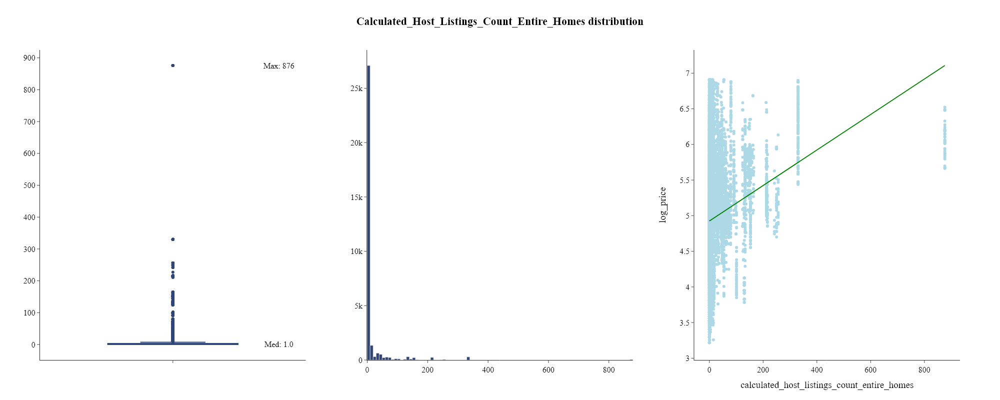

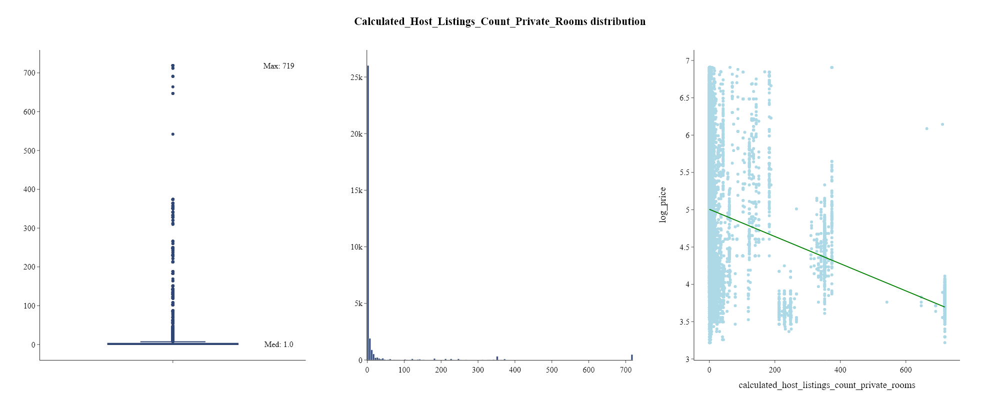

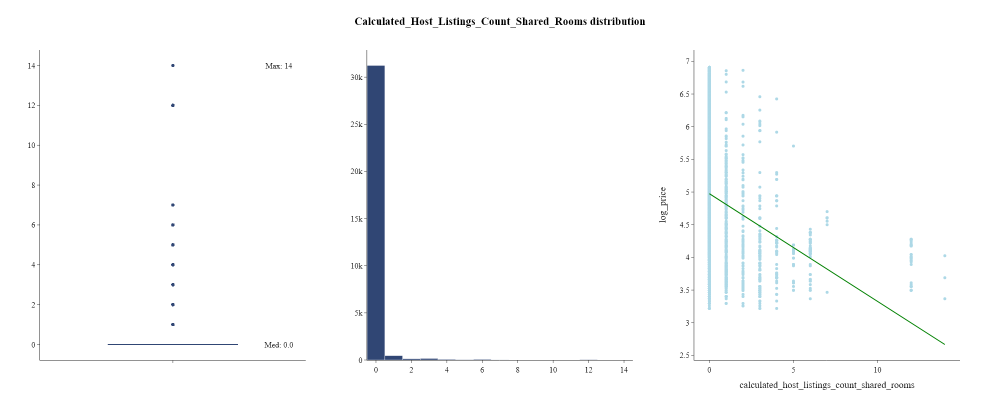

In [44]:
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_entire_homes", "log_price", name="calculated_host_listings_count_entire_homes", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_private_rooms", "log_price", name="calculated_host_listings_count_private_rooms", annotations=["Med", "Max"], bin_size=5)
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_shared_rooms", "log_price", name="calculated_host_listings_count_shared_rooms", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- The distribution of the `calculated_host_listings_count_entire_homes`, `calculated_host_listings_count_private_rooms` and `calculated_host_listings_count_shared_rooms` variables are right-skewed.
- Most of the hosts do not have any shared rooms, and feature looks like redundant, however it will be kept for now and I will investigate it further durring statistical analysis.

**Conclusion:**
- I can't apply log transformation to above variables due to 0 values, therefore I will apply a square root transformation to make them more normally distributed.

In [45]:
listings["root_calculated_host_listings_count_entire_homes"] = np.sqrt(listings["calculated_host_listings_count_entire_homes"])
listings["root_calculated_host_listings_count_private_rooms"] = np.sqrt(listings["calculated_host_listings_count_private_rooms"])
listings["root_calculated_host_listings_count_shared_rooms"] = np.sqrt(listings["calculated_host_listings_count_shared_rooms"])
listings.drop(['calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms'], axis=1, inplace=True)

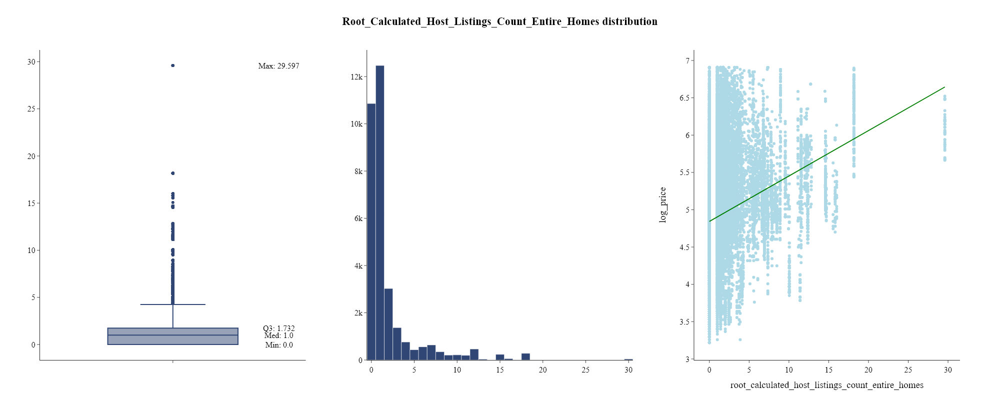

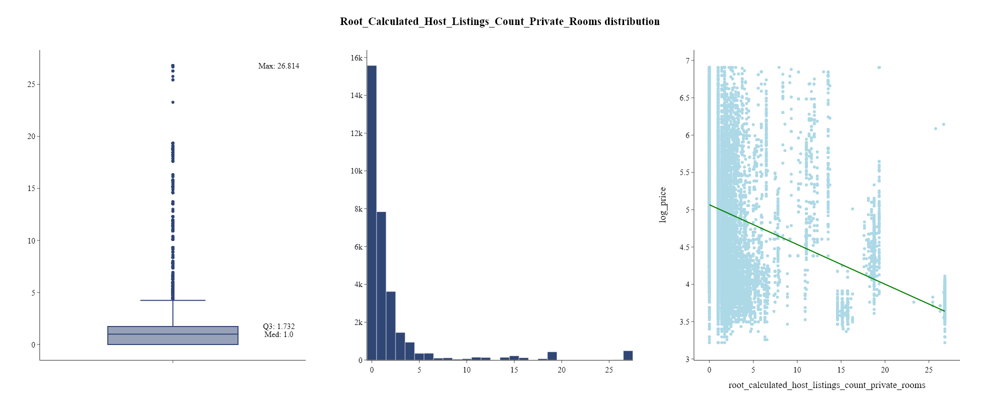

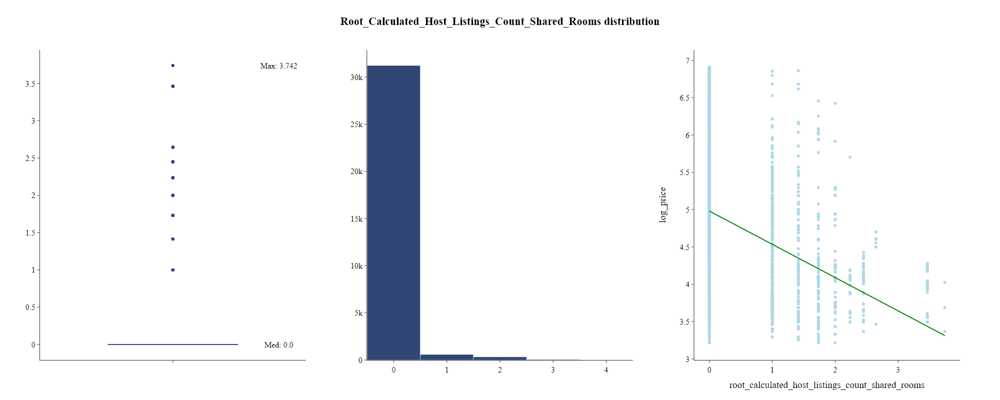

In [46]:
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_entire_homes", "log_price", name="root_calculated_host_listings_count_entire_homes", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_private_rooms", "log_price", name="root_calculated_host_listings_count_private_rooms", annotations=["Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_shared_rooms", "log_price", name="root_calculated_host_listings_count_shared_rooms", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- Applying square root transformation to the variables did not make them normally distributed, but the skewness and spread of the data have been reduced.

## `host_verifications`

`host_verifications` - the verifications that the host has.

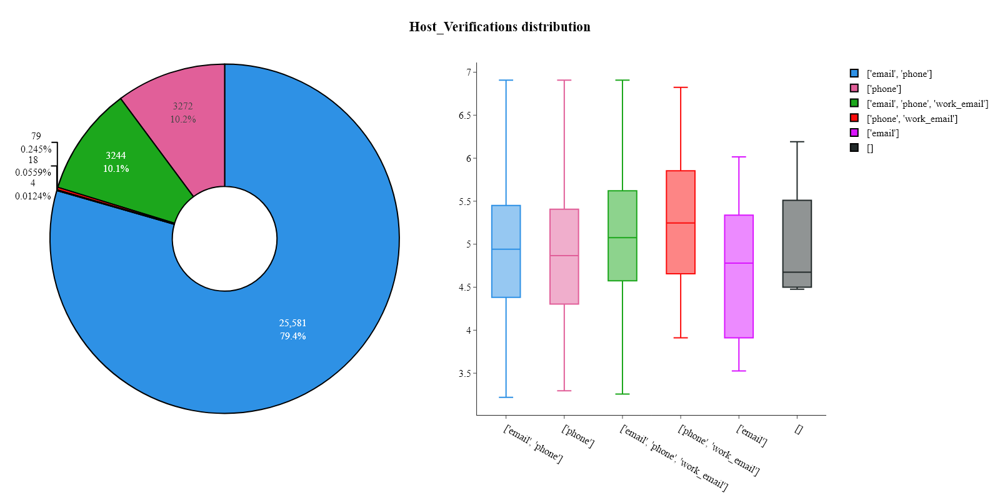

In [47]:
plots.pie_boxplot_by_categorical(listings, "host_verifications", "log_price", name="host_verifications")

**Notes:**
- The categories are quite strange and are a list of verifications that the host has.
- The most common verification is ['email', 'phone'].

**Conclusion:**
- I will create seperate binary columns for each verification type (except of photographer which is less common) and one more column with the total number of verifications.

In [48]:
listings["host_verification_email"] = listings["host_verifications"].apply(lambda x: 1 if 'email' in x else 0).astype(bool)
listings["host_verification_phone"] = listings["host_verifications"].apply(lambda x: 1 if 'phone' in x else 0).astype(bool)
listings["host_verification_work_email"] = listings["host_verifications"].apply(lambda x: 1 if 'work_email' in x else 0).astype(bool)
# listings["host_verification_count"] = listings["host_verifications"].apply(lambda x: x.count("'")//2)
listings.drop(['host_verifications'], axis=1, inplace=True)

## `host_identity_verified`

`host_identity_verified` - whether the host has verified their identity or not.

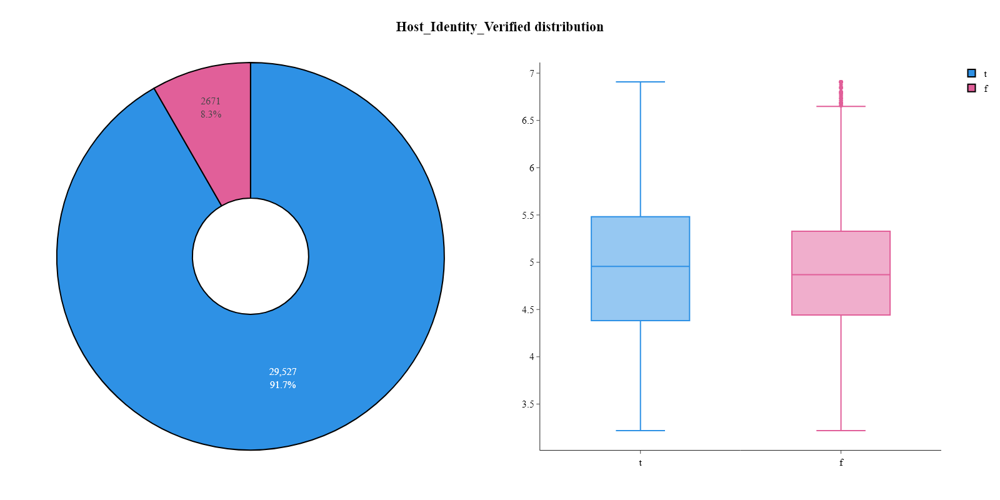

In [49]:
plots.pie_boxplot_by_categorical(listings, "host_identity_verified", "log_price", name="host_identity_verified")

**Notes:**
- `host_identity_verified` is a binary variable.
- Almost all hosts have verified their identity and it seems that the listings for which the host has verified their identity have slightly higher median price.

**Conclusion:**
- I will use Label-Encoder to convert the `host_identity_verified` variable into a numerical format (0 - not verified, 1 - verified).

In [50]:
listings['host_identity_verified'] = listings['host_identity_verified'].map({'t': 1, 'f': 0}).astype(bool)

## `host_has_profile_pic`

`host_has_profile_pic` - whether the host has a profile picture or not.

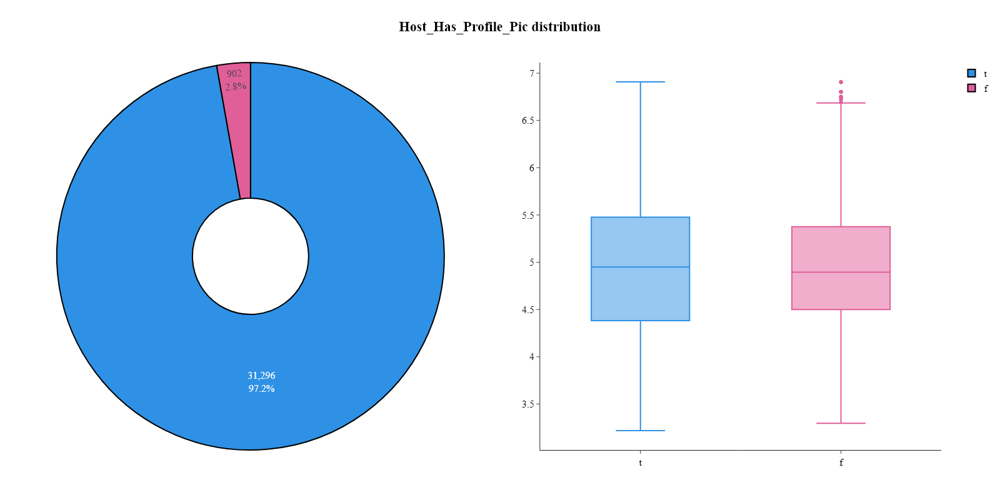

In [51]:
plots.pie_boxplot_by_categorical(listings, "host_has_profile_pic", "log_price", name="host_has_profile_pic")

**Notes:**
- `host_has_profile_pic` is a binary variable.
- Almost all hosts have a profile picture and it seems that the listings for which the host has a profile picture have slightly higher median price.

**Conclusion:**
- I will use Label-Encoder to convert the `host_has_profile_pic` variable into a numerical format (0 - no profile picture, 1 - profile picture).

In [52]:
listings['host_has_profile_pic'] = listings['host_has_profile_pic'].map({'t': 1, 'f': 0}).astype(bool)

# Property attributes

## `property_type`

`property_type` - self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field

In [53]:
print("Number of unique values in property_type:", listings['property_type'].nunique())
print("\nUnique values in property_type:\n")
print("\n".join(listings['property_type'].unique()))

Number of unique values in property_type: 69

Unique values in property_type:

Entire rental unit
Private room in rental unit
Private room in condo
Private room in guest suite
Entire place
Entire loft
Private room in townhouse
Entire condo
Private room in loft
Entire townhouse
Entire home
Private room in home
Entire guesthouse
Shared room in rental unit
Room in boutique hotel
Private room in bed and breakfast
Entire serviced apartment
Entire guest suite
Private room in houseboat
Private room in vacation home
Shared room in home
Private room
Private room in guesthouse
Boat
Room in serviced apartment
Entire cottage
Private room in religious building
Casa particular
Private room in villa
Private room in serviced apartment
Shared room in townhouse
Private room in tiny home
Entire bungalow
Room in hotel
Shared room in condo
Houseboat
Entire villa
Floor
Private room in casa particular
Tiny home
Shared room in loft
Room in aparthotel
Private room in bungalow
Entire vacation home
Private room 

There are many categories in the `property_type` variable, therefore after investigating the categories I will group them into more general categories:
- Apartment
- House
- Other

In [54]:
property_type_mapping = {'Apartment': ["Entire rental unit", "Private room in rental unit", "Entire condo", "Private room in condo", "Entire serviced apartment", "Entire loft", "Room in aparthotel"],
                        "House": ["Private room in home", "Entire home", "Private room in townhouse", "Entire townhouse", "Private room in bed and breakfast", "Private room in guesthouse", "Entire guesthouse", "Private room in guest suite", "Entire guest suite"]}
listings['property_type'] = listings['property_type'].apply(lambda x: 'Apartment' if x in property_type_mapping['Apartment'] else ('House' if x in property_type_mapping['House'] else 'Other'))

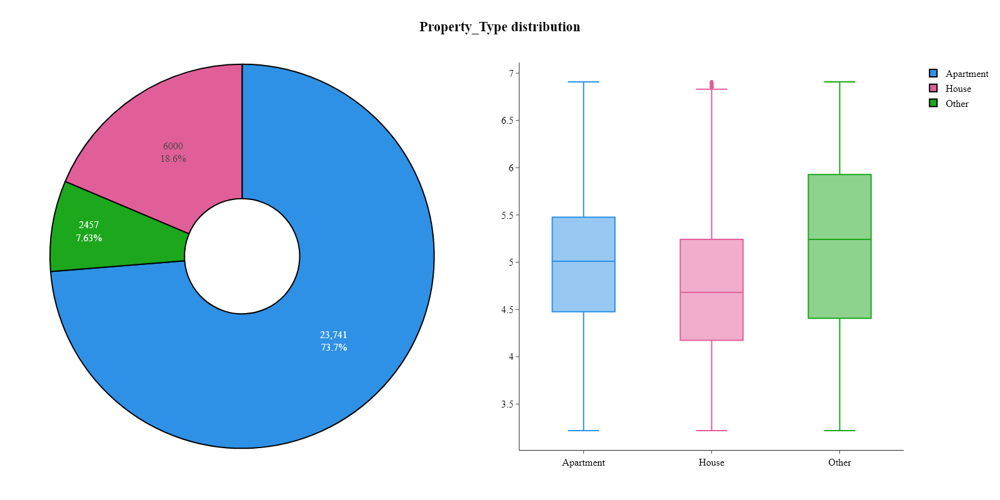

In [55]:
plots.pie_boxplot_by_categorical(listings, "property_type", "log_price", name="property_type")

**Notes:**
- The most common 'group' of property type is 'Apartment'.
- The median `log_price` is higher for 'Apartment' than for 'House'.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [56]:
listings["property_type"] = listings["property_type"].astype('category')

## `room_type`

`room_type` - the type of room that is being listed.

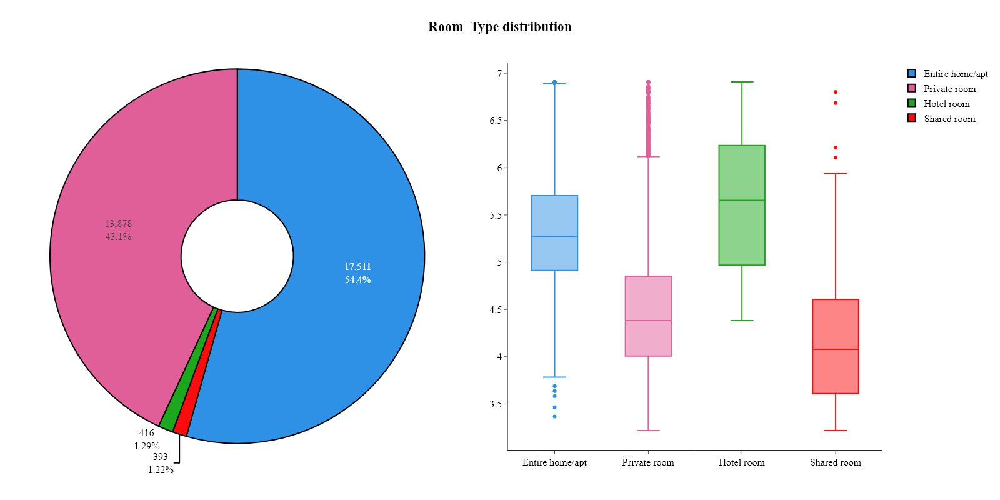

In [57]:
plots.pie_boxplot_by_categorical(listings, "room_type", "log_price", name="room_type")

**Notes:**
- 'Shared room' and 'Hotel room' are much less common than 'Entire home/apt' and 'Private room', however the difference between the median price between 'Shared room' and 'Hotel room' is significant so it is worth to keep them as separate categories instead of grouping them into 'Other'.
- For 'Entire home/apt' and 'Hotel room' the median `log_price` is higher than for 'Private room' and 'Shared room'.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [58]:
listings["room_type"] = listings["room_type"].astype('category')

## `accommodates`

`accommodates` - The maximum capacity of the listing

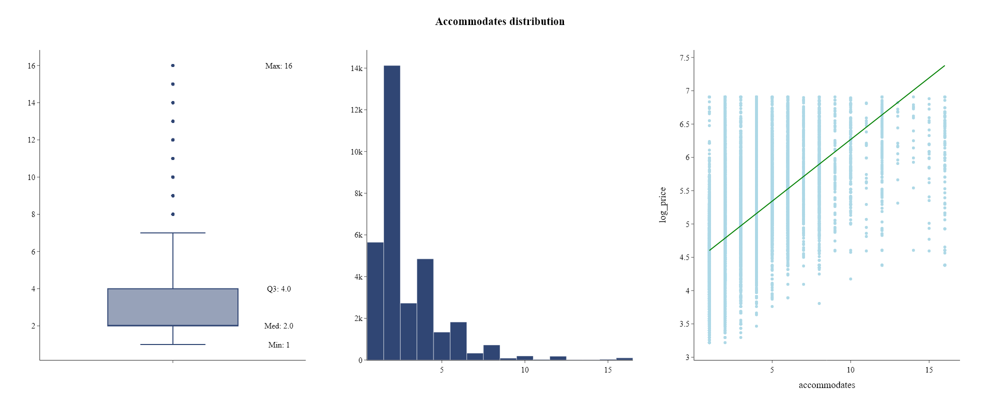

In [59]:
plots.histogram_boxplot_linear_regression(listings, "accommodates", "log_price", name="accommodates", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The distribution of the `accommodates` variable is right-skewed, but due to the fact that is is a discrete variable, I will not apply any transformation.
- It seems that the listings which can accommodate more people have on average higher `log_price`.

## `bedrooms`

`bedrooms` - the number of bedrooms in the listing.

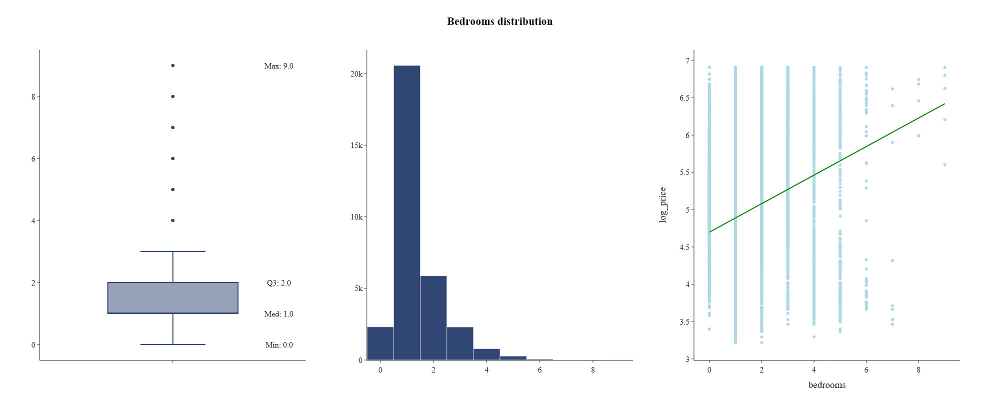

In [60]:
plots.histogram_boxplot_linear_regression(listings, "bedrooms", "log_price", name="bedrooms", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The median value of the `bedrooms` variable is 1.
- The more bedrooms the listing has, the higher the `log_price`.

## `beds`

`beds` - the number of beds in the listing.

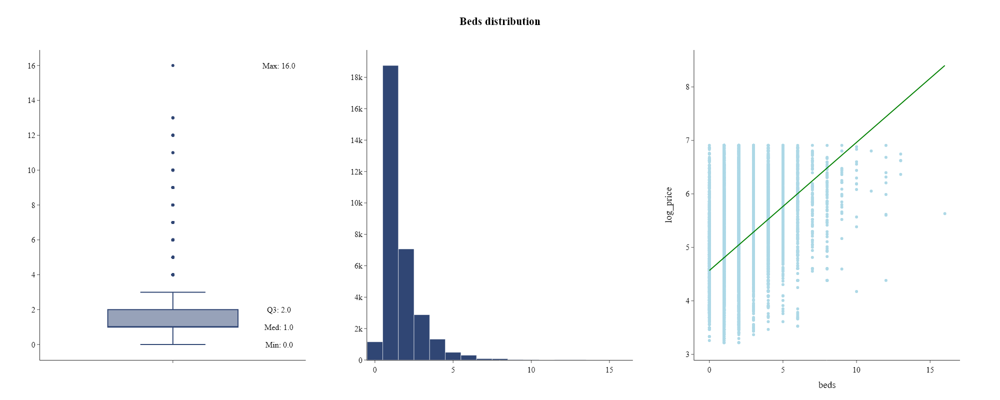

In [61]:
plots.histogram_boxplot_linear_regression(listings, "beds", "log_price", name="beds", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The distribution of `beds` variable is very similar to the distribution of `bedrooms` variable with the median value equal to 1.
- The more beds the listing has, the higher the `log_price`.

## `bathrooms_number`

`bathrooms_number` - the number of bathrooms in the listing.

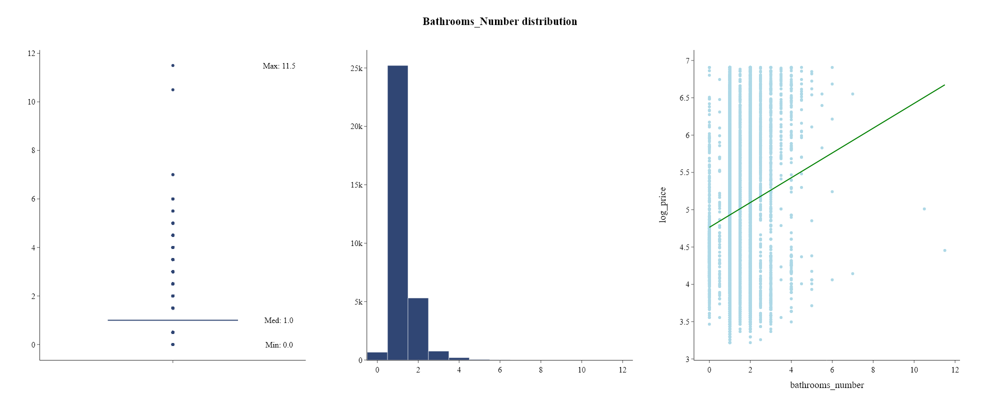

In [62]:
plots.histogram_boxplot_linear_regression(listings, "bathrooms_number", "log_price", name="bathrooms_number", annotations=["Min", "Med", "Max"], bin_size=1)

**Notes:**
- The distribution of the `bathrooms_number` variable is right-skewed.
- The more bathrooms the listing has, the higher the median `log_price`.

## `is_bathroom_shared`

`is_bathroom_shared` - whether the bathroom is shared or not.

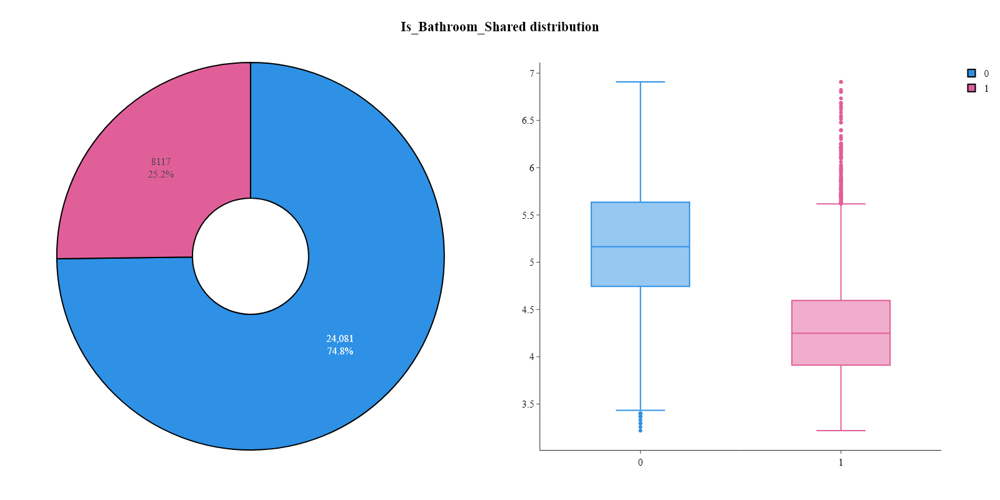

In [63]:
plots.pie_boxplot_by_categorical(listings, "is_bathroom_shared", "log_price", name="is_bathroom_shared")

**Notes:**
- `is_bathroom_shared` is a binary variable.
- Majority of the listings have a private bathroom.
- It seems that the listings for which the bathroom is shared have on average lower `log_price`.

## `amenities`

`amenities` - a list of amenities that the listing includes.

In [64]:
listings["amenities_cleaned"] = listings["amenities"].str.replace(r"[\"{}\[\]\\u]", "", regex=True).str.strip()
listings["amenities_cleaned"] = listings["amenities_cleaned"].str.split(", ")
top_10_amenities = listings.explode("amenities_cleaned").groupby(["amenities_cleaned"]).size().sort_values(ascending=False).head(10).reset_index().rename(columns={"amenities_cleaned": "Amenity", 0: "Count"})
print("Top 10 amenities:\n", top_10_amenities)
print("\nNumber of unique amenities:", listings.explode("amenities_cleaned")["amenities_cleaned"].nunique())

Top 10 amenities:
                  Amenity  Count
0            Smoke alarm  28942
1                   Wifi  28568
2                Kitchen  26412
3  Carbon monoxide alarm  26269
4              Hot water  23630
5             Essentials  22874
6                Hangers  21897
7  Dishes and silverware  20947
8             Hair dryer  20099
9                   Iron  20070

Number of unique amenities: 5519


Due to the fact that there are plenty of amenities in the `amenities_cleaned` variable, I will not investigate them one by one, but choose the most common ones and create new binary columns for them.

The scheme of finding most common amenities is as follows:

1. Calculate occurence of each unique amenity per borough.
2. Extract only those amenities which occured in at least 30% of the listings in EACH borough.
3. Create binary column 

1. Calculate occurence of each unique amenity per borough.

In [65]:
amenities_grouped = listings.explode("amenities_cleaned").groupby(["borough", "amenities_cleaned"]).size().unstack(fill_value=0)
amenities_percentage = amenities_grouped.div(listings["borough"].value_counts(), axis=0).transpose()
top_amenities = {key: amenities_percentage[key].sort_values(ascending=False).head(10) for key in amenities_percentage.columns}
top_amenities_df = pd.DataFrame(top_amenities)
top_amenities_df.style.background_gradient(cmap='Blues')

,Bronx,Brooklyn,Manhattan,Queens,Staten Island
amenities_cleaned,,,,,
Air conditioning,nan,nan,0.691474,nan,nan
Carbon monoxide alarm,0.860643,0.838077,0.786023,0.830043,0.914216
Cooking basics,0.646248,0.626015,nan,nan,nan
Dishes and silverware,0.695253,0.668927,nan,0.671893,0.732843
Essentials,0.742726,0.693371,0.732440,0.675571,0.754902
Hair dryer,nan,nan,0.644837,0.633566,nan
Hangers,0.676110,0.649567,0.693954,0.703639,0.752451
Hot water,0.732772,0.721117,0.745056,0.728417,0.772059
Iron,0.684533,nan,0.636615,nan,0.661765


2. Extract only those amenities which occured in at least 30% of the listings in EACH borough.

In [66]:
percentage_threshold = 0.5
filtered_amenities = {key: value[value >= percentage_threshold].index for key, value in amenities_percentage.items()}
filtered_amenities = list(set.intersection(*[set(value) for value in filtered_amenities.values()]))
filtered_amenities.sort()
print(f"Amenities which occured at least in {percentage_threshold*100}% of listings in each borough:\n{filtered_amenities}")

Amenities which occured at least in 50.0% of listings in each borough:
['Air conditioning', 'Bed linens', 'Carbon monoxide alarm', 'Cooking basics', 'Dedicated workspace', 'Dishes and silverware', 'Essentials', 'Hair dryer', 'Hangers', 'Hot water', 'Iron', 'Kitchen', 'Microwave', 'Refrigerator', 'Smoke alarm', 'Wifi']


In [67]:
amenities_df = pd.DataFrame(amenities_percentage)
filtered_amenities_df = amenities_df.loc[list(filtered_amenities)]
filtered_amenities_df.style.background_gradient(cmap='Blues')

borough,Bronx,Brooklyn,Manhattan,Queens,Staten Island
amenities_cleaned,,,,,
Air conditioning,0.538285,0.584976,0.691474,0.536585,0.544118
Bed linens,0.598009,0.569721,0.626054,0.595238,0.649510
Carbon monoxide alarm,0.860643,0.838077,0.786023,0.830043,0.914216
Cooking basics,0.646248,0.626015,0.569920,0.585366,0.649510
Dedicated workspace,0.591118,0.615844,0.595294,0.590205,0.580882
Dishes and silverware,0.695253,0.668927,0.621660,0.671893,0.732843
Essentials,0.742726,0.693371,0.732440,0.675571,0.754902
Hair dryer,0.614089,0.595950,0.644837,0.633566,0.602941
Hangers,0.676110,0.649567,0.693954,0.703639,0.752451


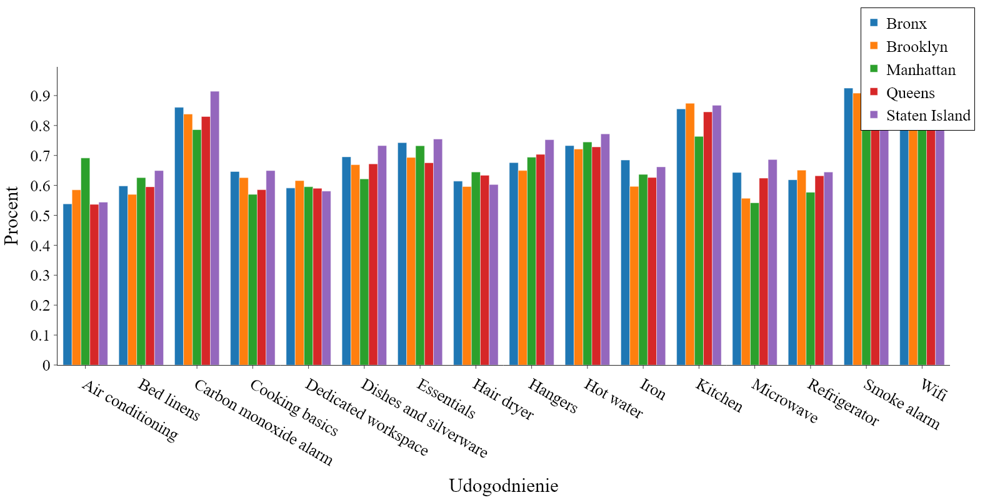

In [68]:
plots.plot_amenities_distribution(filtered_amenities_df)

3. Create binary column for each of the most common amenities.

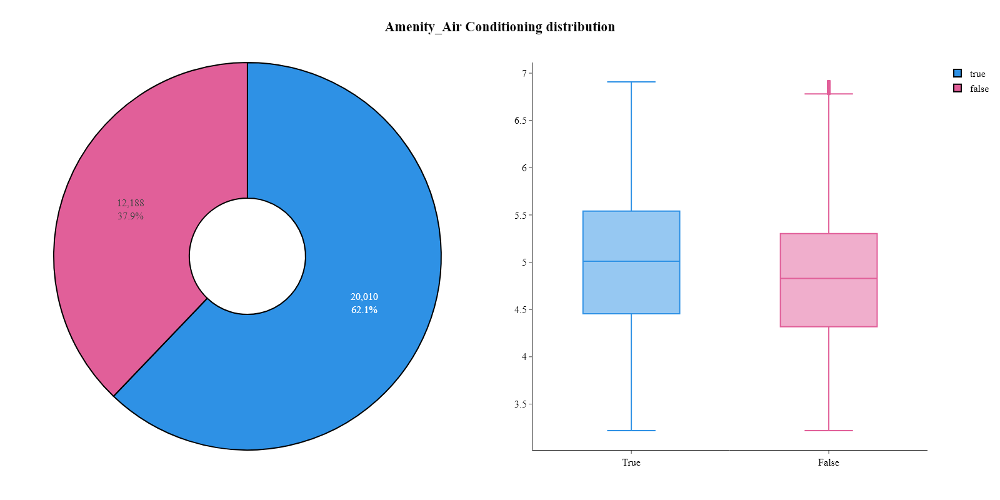

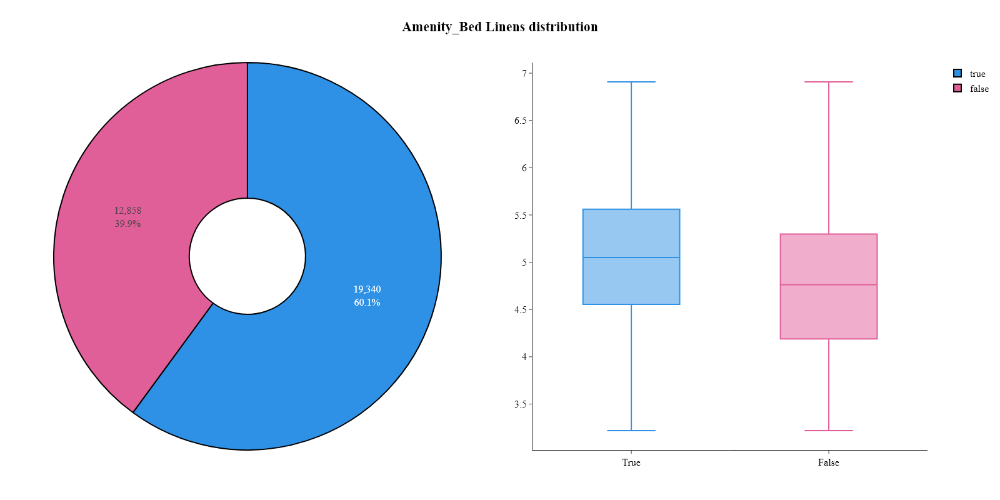

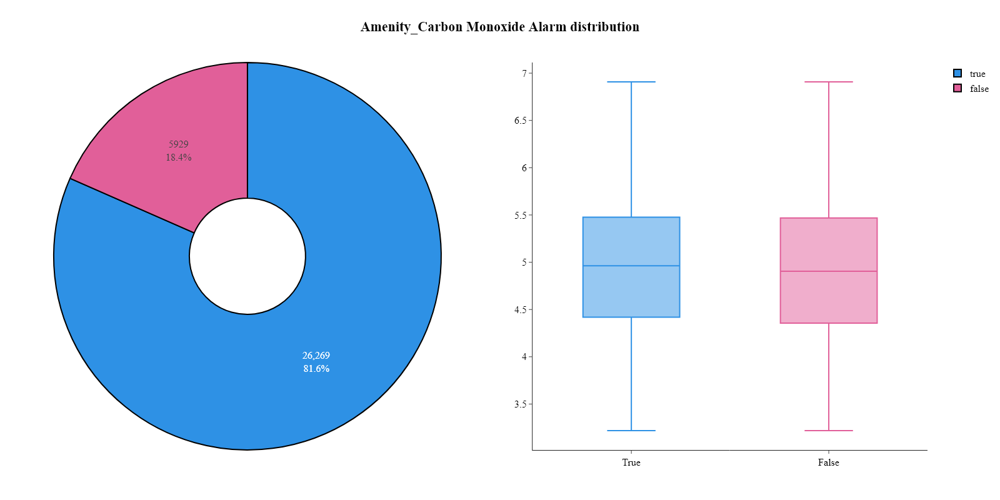

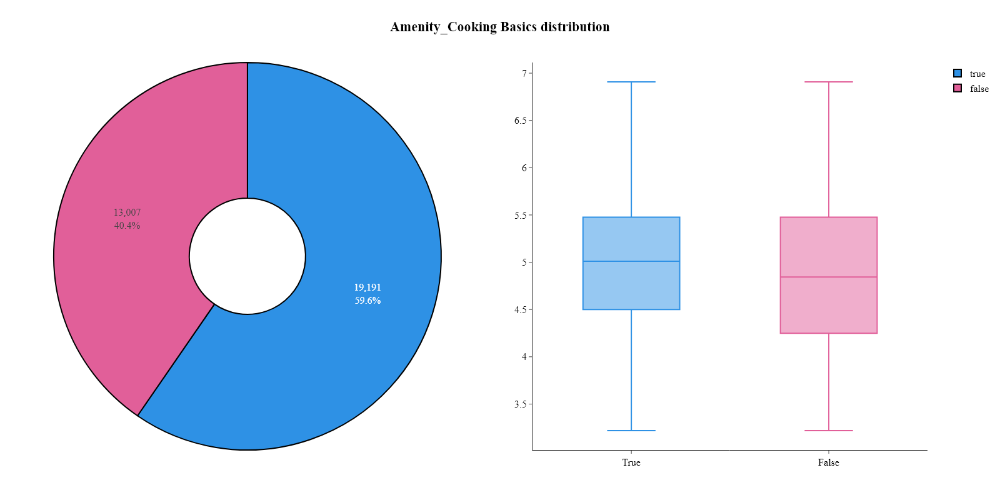

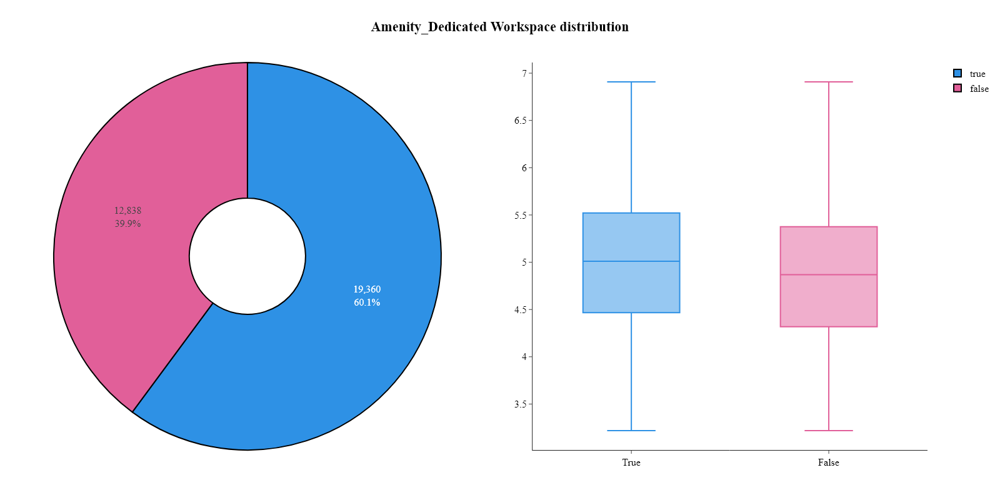

...

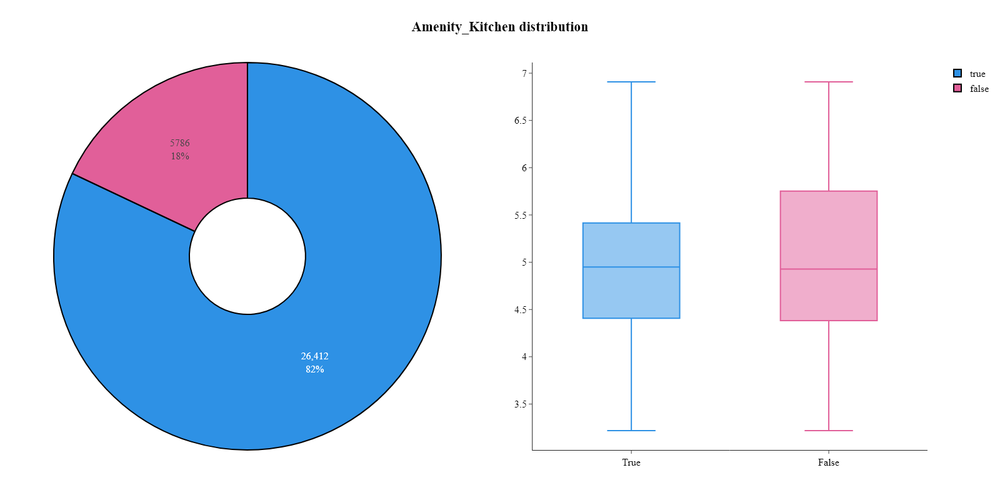

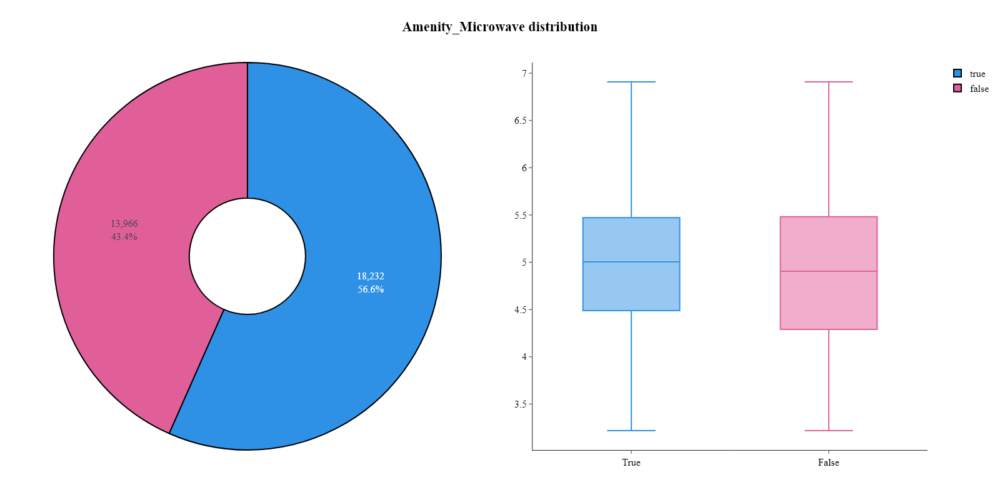

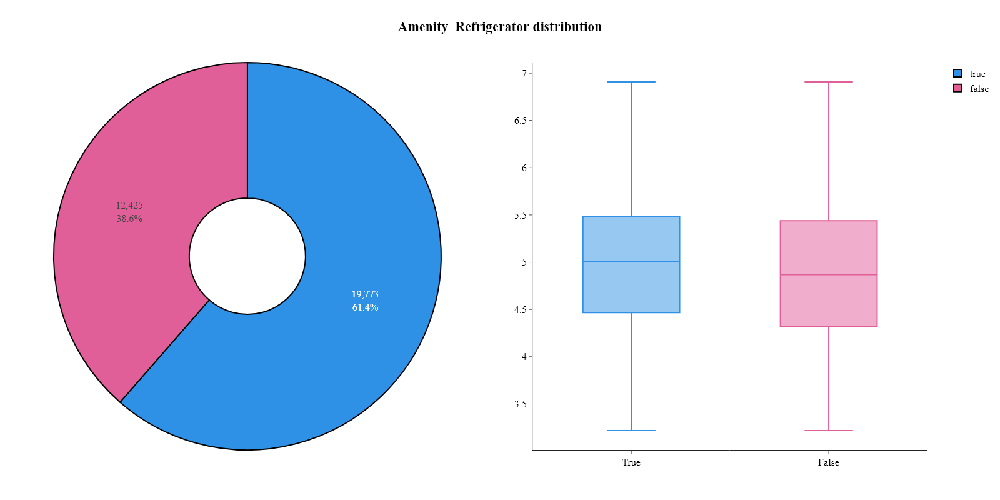

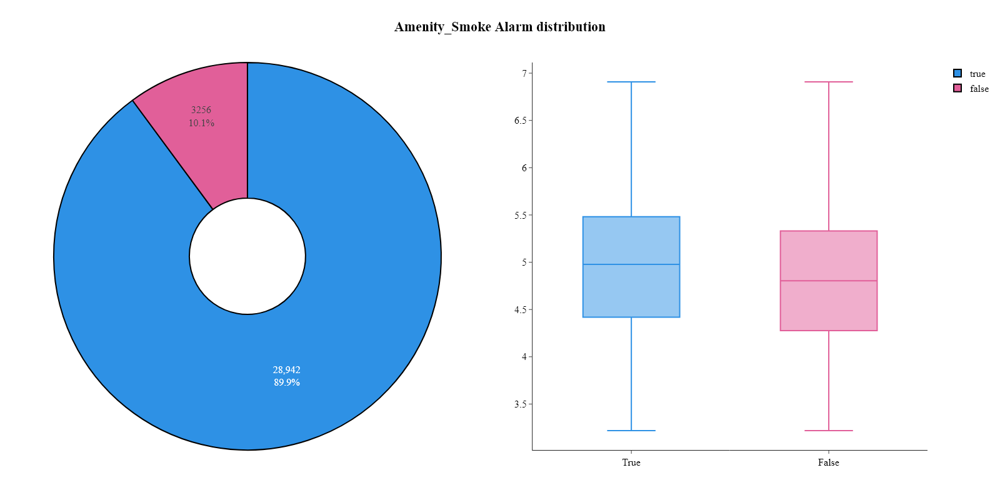

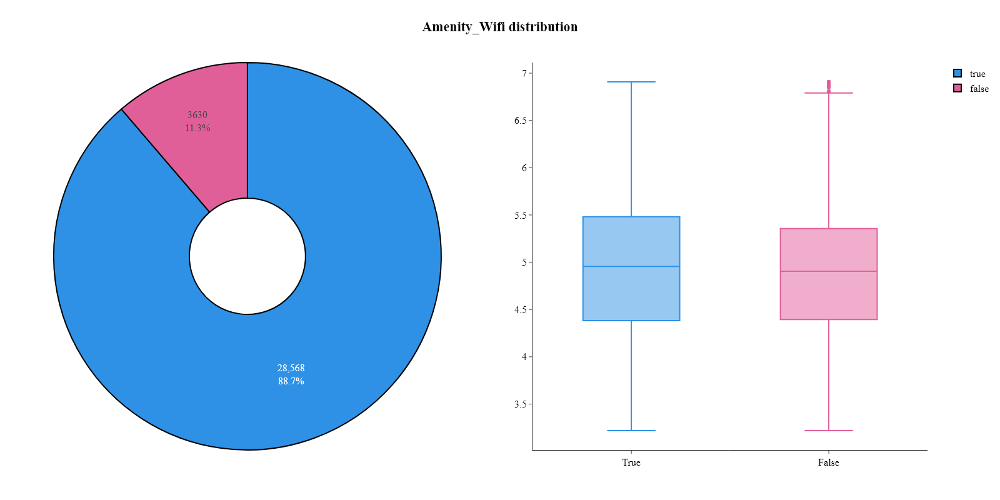

In [69]:
for amenity in filtered_amenities:
    amenity_name = f"amenity_{amenity}".lower()
    listings[amenity_name] = listings["amenities_cleaned"].apply(lambda x: 1 if amenity in x else 0).astype(bool)
    plots.pie_boxplot_by_categorical(listings, amenity_name, "log_price", name=amenity_name)

**Notes:**
- There are no huge differences in the median `log_price` between listings with and without the most common amenities.
- It seems that some of the most influential amenities are: Hair dryer, Iron and Essentials, however the difference in median `log_price` is not significant.

We will also create a new feature `number_of_amenities` which will represent the total number of amenities that the listing includes.

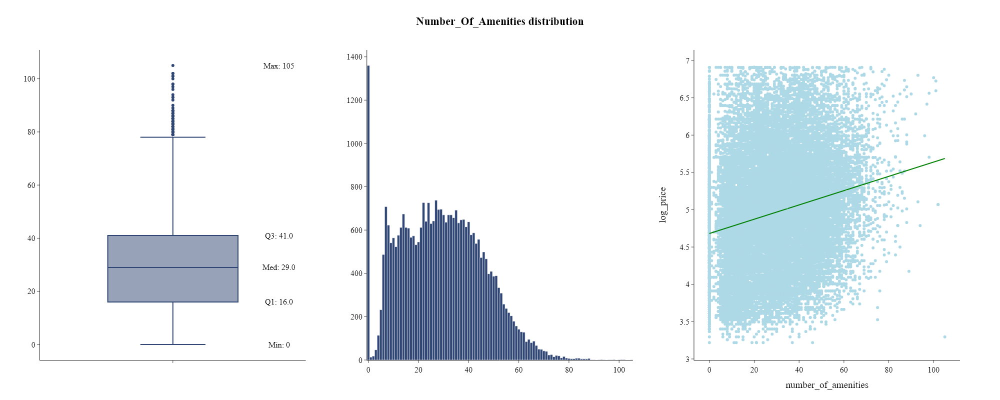

In [70]:
listings['number_of_amenities'] = listings['amenities_cleaned'].apply(lambda x: len(x) if x[0] else 0)
plots.histogram_boxplot_linear_regression(listings, "number_of_amenities", "log_price", name="number_of_amenities", annotations=True, bin_size=1)

In [71]:
describe = listings["number_of_amenities"].describe()[["min", "50%", "mean", "max", "std"]].round(2).to_frame().T
describe = describe.applymap(lambda x: int(x) if str(x).endswith(".0") else x)
describe

,min,50%,mean,max,std
number_of_amenities,0,29,29.33,105,16.56


**Notes:**
- Maximum number of amenities is 105, while the median is 29.
- From the linear relationship plot between `number_of_amenities` and `log_price` we can see that there is a slight positive linear relationship between the number of amenities and the price of the listing.

**Conclusion:**
- I will drop `amenities` and `amenities_cleaned` variables from the dataset and I will use the `number_of_amenities` variable instead. 


In [72]:
listings.drop(['amenities', 'amenities_cleaned'], axis=1, inplace=True)

## `borough`

`borough` - the borough in which the listing is located.

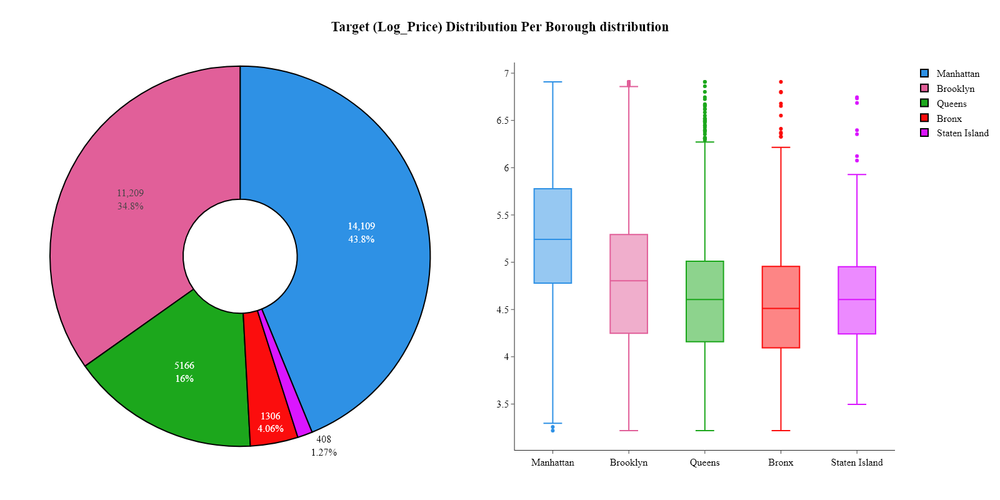

In [73]:
plots.pie_boxplot_by_categorical(listings, "borough", "log_price", name="Target (log_price) distribution per borough")

**Notes:**
- The most common borough is Manhattan.
- The median `log_price` is the highest for listings located in Manhattan.

**Conclusion:**
- I will rename the `borough` to `district` and I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [74]:
listings.rename(columns={"borough": "district"}, inplace=True)
listings['district'] = listings['district'].astype('category')

# Customer reviews

## `number_of_reviews`, `number_of_reviews_ltm`, `number_of_reviews_l30d`

`number_of_reviews` - the number of reviews that the listing has.

`number_of_reviews_ltm` - the number of reviews that the listing has in the last twelve months.

`number_of_reviews_l30d` - the number of reviews that the listing has in the last 30 days.

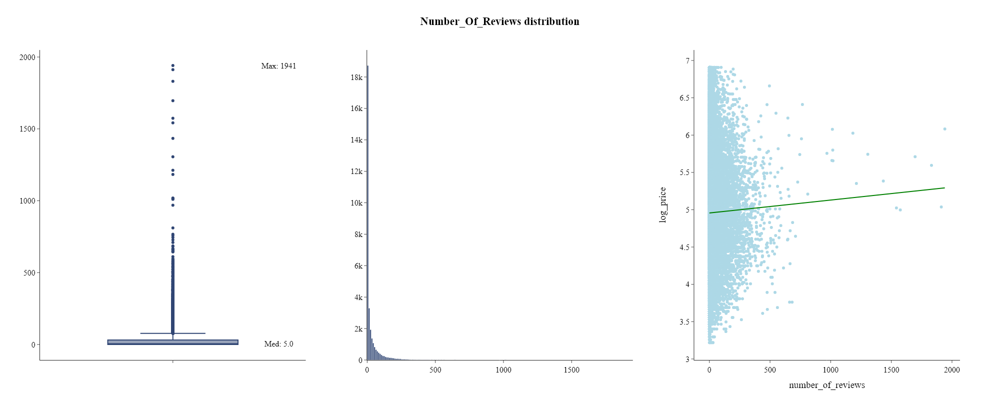

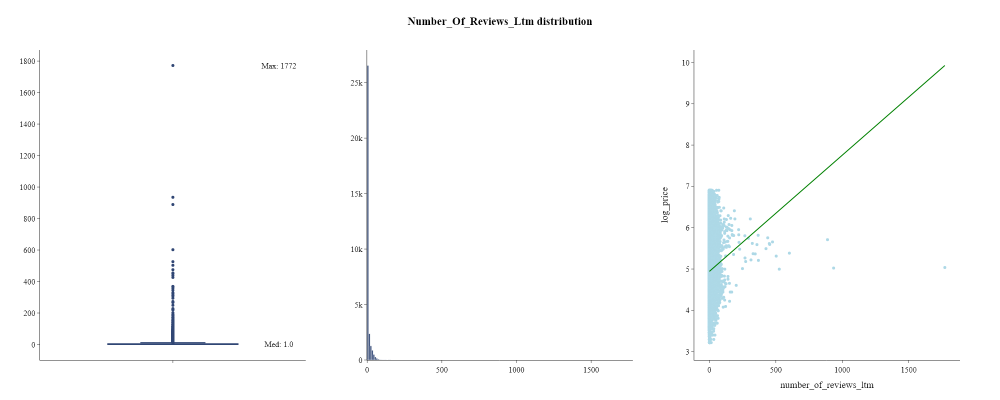

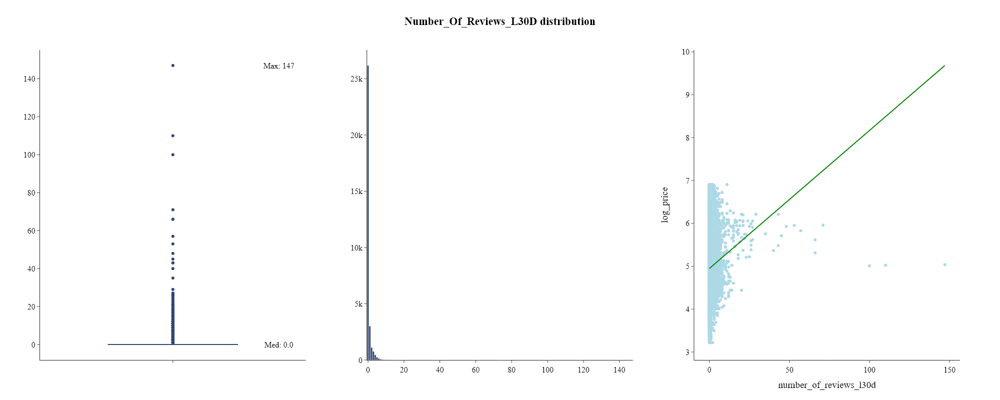

In [75]:
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews", "log_price", name="number_of_reviews", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews_ltm", "log_price", name="number_of_reviews_ltm", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews_l30d", "log_price", name="number_of_reviews_l30d", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- All three variables are right-skewed.

**Conclusion:**
- I will apply a square root transformation (unable to apply log transformation due to 0 values) to the `number_of_reviews`, `number_of_reviews_ltm` and `number_of_reviews_l30d` variables to make them more normally distributed.

In [76]:
listings['root_number_of_reviews'] = np.sqrt(listings['number_of_reviews'])
listings['root_number_of_reviews_ltm'] = np.sqrt(listings['number_of_reviews_ltm'])
listings['root_number_of_reviews_l30d'] = np.sqrt(listings['number_of_reviews_l30d'])
listings.drop(['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d'], axis=1, inplace=True)

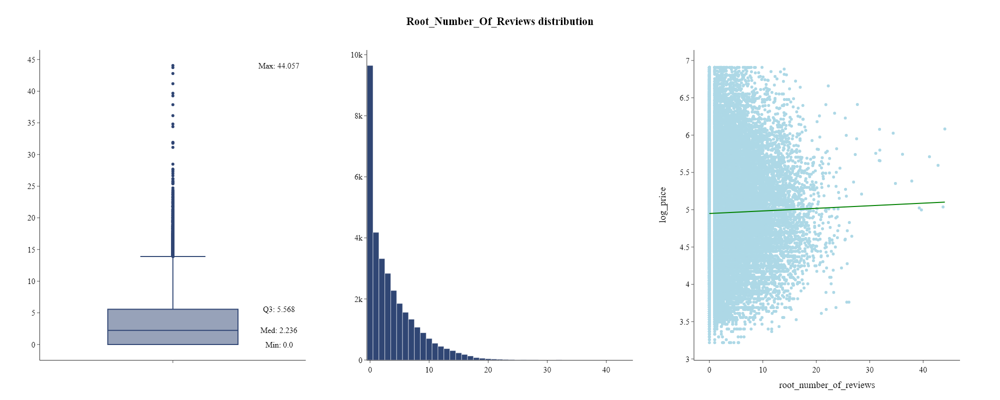

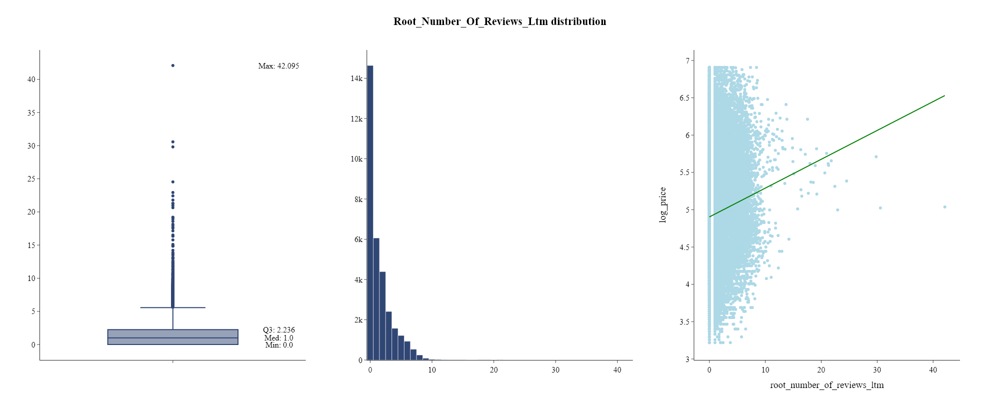

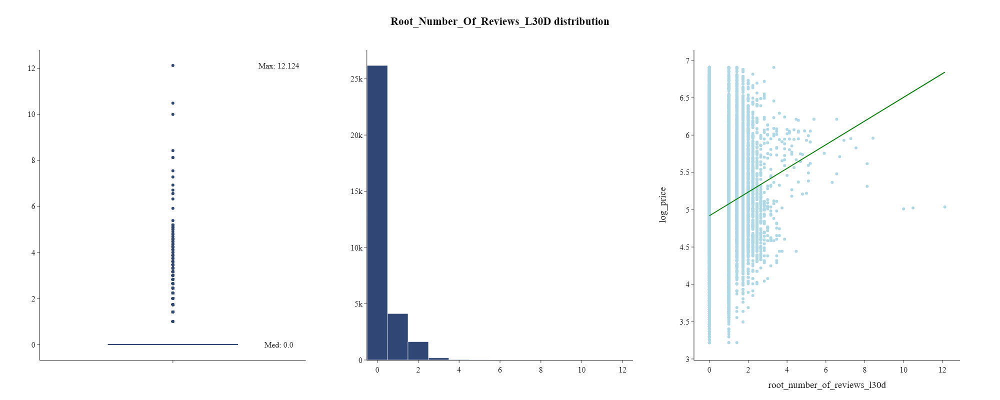

In [77]:
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews", "log_price", name="root_number_of_reviews", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews_ltm", "log_price", name="root_number_of_reviews_ltm", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews_l30d", "log_price", name="root_number_of_reviews_l30d", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- After applying the square root transformation, the distributions of the `number_of_reviews`, `number_of_reviews_ltm` and `number_of_reviews_l30d` are still right-skewed, but the skewness is lower than before.

## `time_since_first_review`

`time_since_first_review` - the number of days since the first review of the listing.

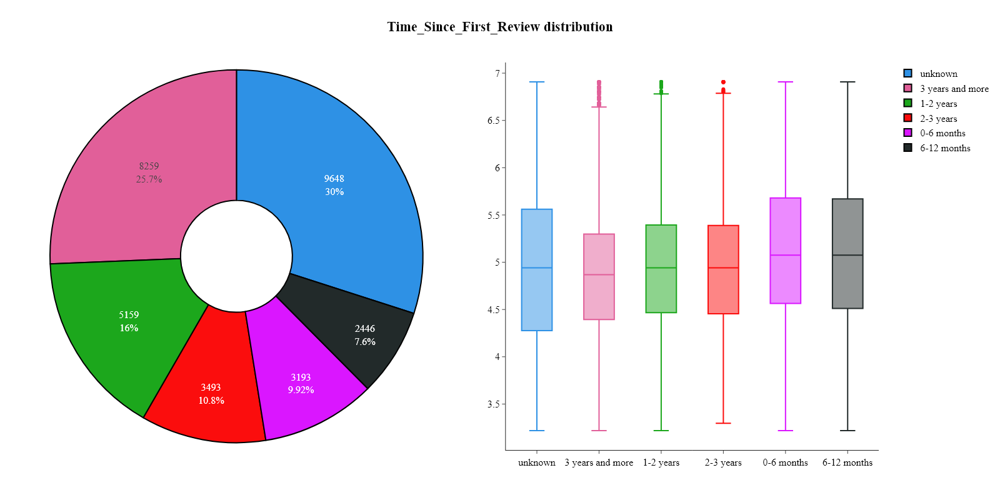

In [78]:
plots.pie_boxplot_by_categorical(listings, "time_since_first_review", "log_price", name="time_since_first_review")

**Notes:**
- The frequency of each category is very similar.
- There is no clear relationship between `time_since_first_review` and `log_price`.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [79]:
listings['time_since_first_review'] = listings['time_since_first_review'].astype('category')

## `time_since_last_review`

`time_since_last_review` - the number of days since the last review of the listing.

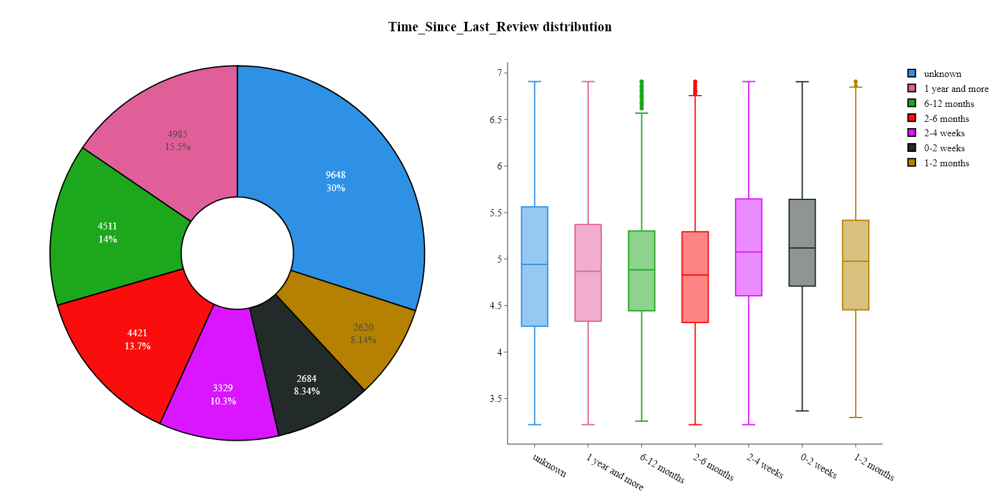

In [80]:
plots.pie_boxplot_by_categorical(listings, "time_since_last_review", "log_price", name="time_since_last_review")

**Notes:**
- The least common category is '6-12 months'.
- Similarly to the `time_since_first_review` variable, there is no clear relationship between `time_since_last_review` and `log_price`.

**Conclusion:**
- I will convert the column to `category` dtype as it is a categorical variable (converting to `category` dtype reduces memory usage).

In [81]:
listings['time_since_last_review'] = listings['time_since_last_review'].astype('category')

## review ratings columns

`review_scores_rating` - the average rating of the listing.

`review_scores_accuracy` - the accuracy of the listing.

`review_scores_cleanliness` - the cleanliness of the listing.

`review_scores_checkin` - the check-in process of the listing.

`review_scores_communication` - the communication of the listing.

`review_scores_location` - the location of the listing.

`review_scores_value` - the value of the listing.

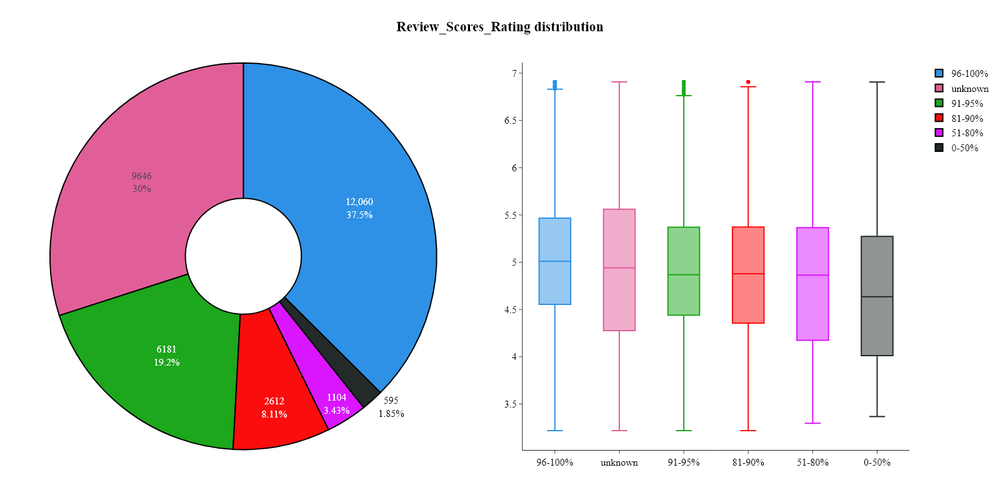

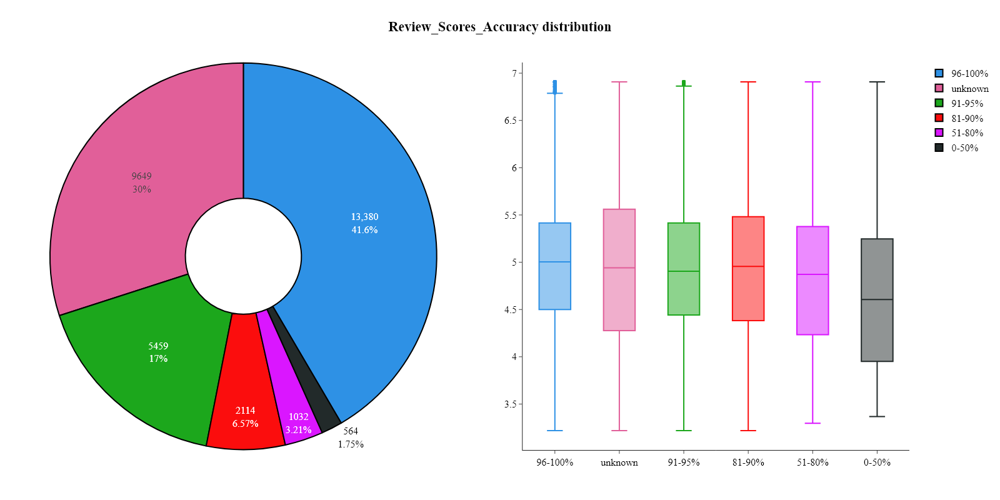

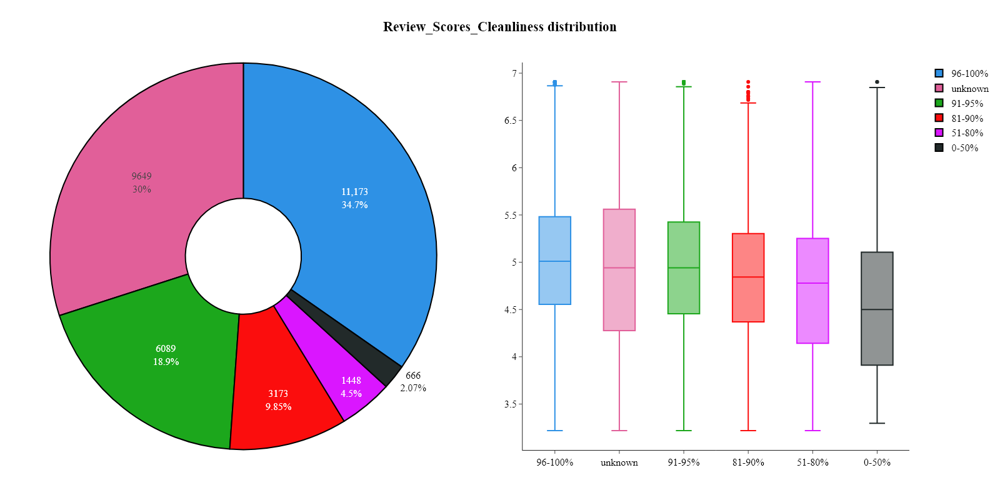

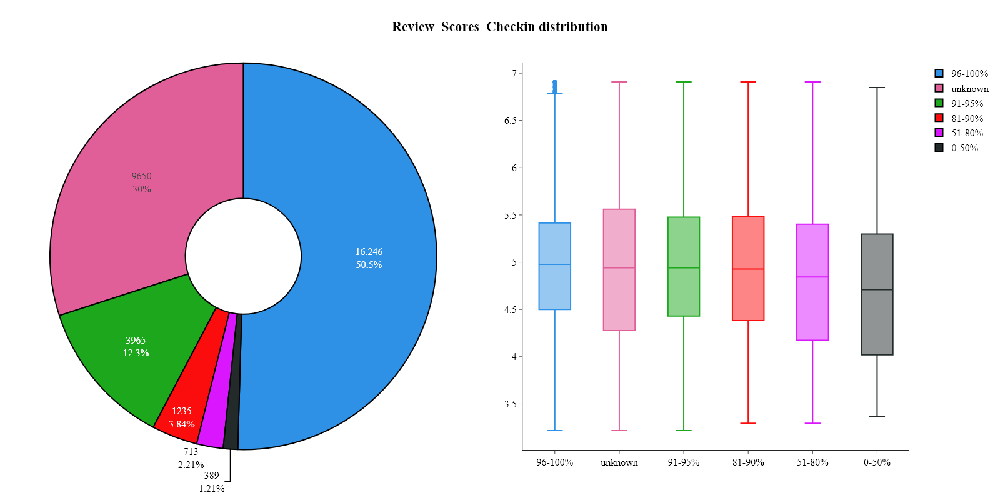

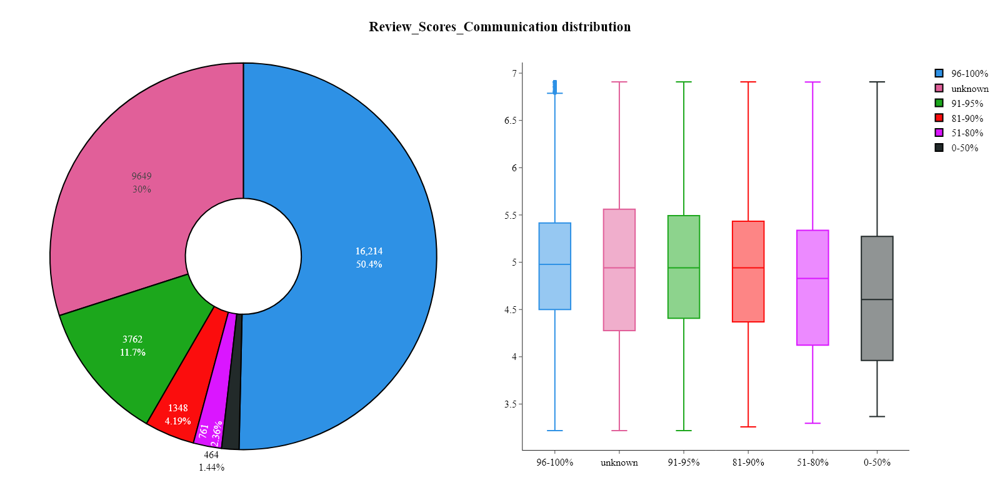

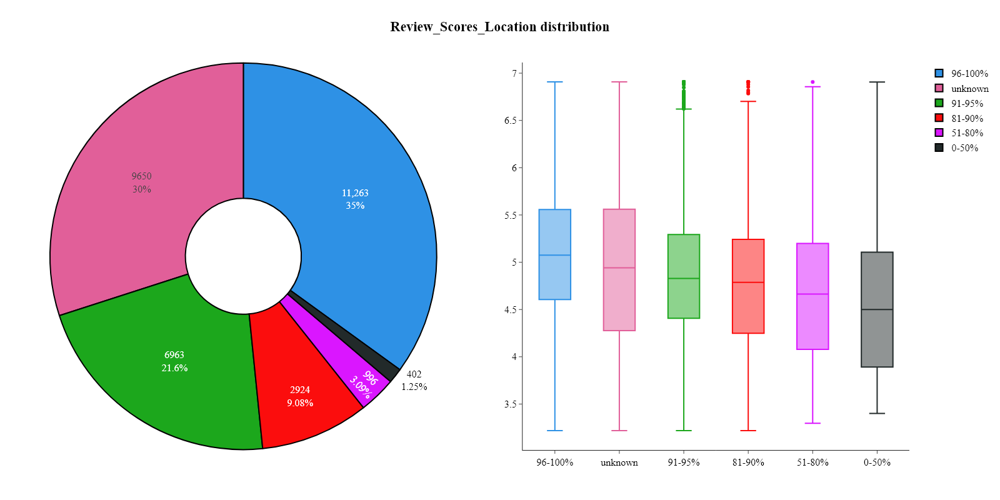

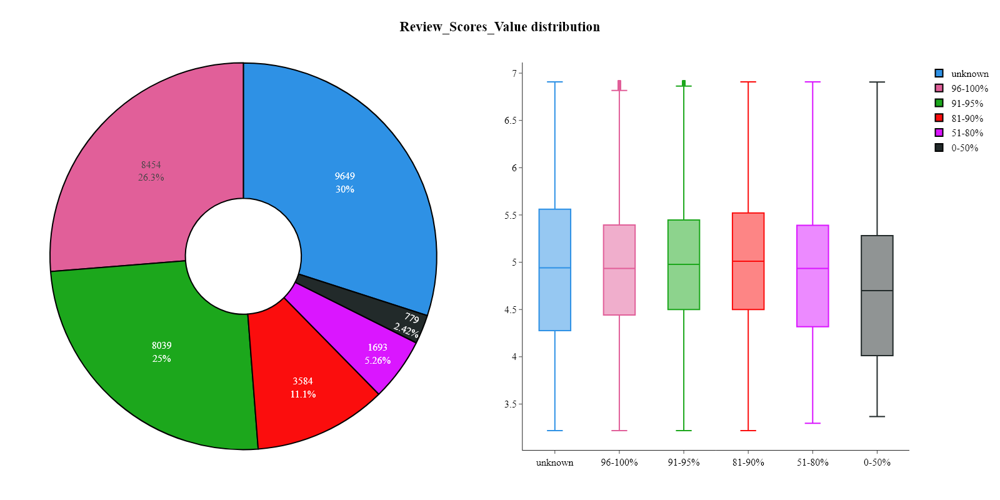

In [82]:
plots.pie_boxplot_by_categorical(listings, "review_scores_rating", "log_price", name="review_scores_rating")
plots.pie_boxplot_by_categorical(listings, "review_scores_accuracy", "log_price", name="review_scores_accuracy")
plots.pie_boxplot_by_categorical(listings, "review_scores_cleanliness", "log_price", name="review_scores_cleanliness")
plots.pie_boxplot_by_categorical(listings, "review_scores_checkin", "log_price", name="review_scores_checkin")
plots.pie_boxplot_by_categorical(listings, "review_scores_communication", "log_price", name="review_scores_communication")
plots.pie_boxplot_by_categorical(listings, "review_scores_location", "log_price", name="review_scores_location")
plots.pie_boxplot_by_categorical(listings, "review_scores_value", "log_price", name="review_scores_value")

**Notes:**
- For most variables related to review scores, the most commont 'bucket' is 96-100%.
- There is no clear relationship between the review scores and the price of the listing (at least in terms of median `log_price`).

**Conclusion:**
- I will convert the columns to `category` dtype as they are categorical variables (converting to `category` dtype reduces memory usage).

In [83]:
for column in ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']:
    listings[column] = listings[column].astype('category')

## Summary

In [84]:
base_information(listings)

,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
listing_id,int64,0,0.000000,32198,32198
listing_url,object,0,0.000000,32198,32198
host_response_time,category,0,0.000000,5,32198
host_response_rate,category,0,0.000000,5,32198
host_acceptance_rate,category,0,0.000000,5,32198
host_is_superhost,bool,0,0.000000,2,32198
host_has_profile_pic,bool,0,0.000000,2,32198
host_identity_verified,bool,0,0.000000,2,32198
district,category,0,0.000000,5,32198
property_type,category,0,0.000000,3,32198


I will not use columns related with amenities for now.

In [85]:
# listings = listings.loc[:,~listings.columns.str.startswith('amenity')]

Due to the fact that MySQL accepts only names without special characters, therefore I will change the names of the columns to be more MySQL-friendly.

In [86]:
listings.columns = listings.columns.str.replace(r'[\s/-]', '_', regex=True)
listings.columns = listings.columns.str.replace('%', '', regex=True)

# Save listings after EDA to DB

In [87]:
table_name = "listings_eda"
drop_table_script = f"""
DROP TABLE IF EXISTS {table_name};
"""
cursor.execute(drop_table_script)

In [88]:
columns_names_and_types = dict(zip(listings.columns, listings.dtypes.tolist()))
columns_names_and_types = {k: str(v) for k, v in columns_names_and_types.items()}
python2sql_dtype = {'int32': 'INTEGER', 'int64': 'BIGINT', 'float64': 'FLOAT', 'bool': 'BOOLEAN', 'object': 'VARCHAR(255)', 'category': 'VARCHAR(255)', 'geometry': 'TEXT'}
primary_key = 'listing_id'
create_script = f"CREATE TABLE {table_name} ({', '.join([f'{k} {python2sql_dtype[v]} NOT NULL' for k, v in columns_names_and_types.items()])}, PRIMARY KEY ({primary_key}));"
cursor.execute(create_script)
DB.commit()

In [89]:
column_names = ', '.join([column for column in listings.columns])
values_string = ', '.join(['%s' for _ in range(len(listings.columns))])
insert_script = f"INSERT INTO {table_name} ({column_names}) VALUES ({values_string})"
values = listings.values.tolist()
values = [[None if pd.isnull(value) else value.strftime('%Y-%m-%d') if (isinstance(value, pd.Timestamp)) else int(value) if (isinstance(value, int)) else str(value) for value in row] for row in values]
cursor.executemany(insert_script, values)
DB.commit()